# Imports

In [1]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer, OneHotEncoder, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import iqr
import scipy.stats as stats
import numpy as np
import plotly.graph_objects as go
import re
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor


# Data Import and Some Preprocessing

In [2]:
data = pd.read_excel('/content/final_dataset.xlsx')


In [3]:
data.head()

,Player,Club,Age,Position,Nation,Value,Contract Years Left,League,Squad (20/21),MP (20/21),...,Offsides (17/18),Crosses (17/18),Interceptions (17/18),Penalty Kicks Won (17/18),Penalties Conceded (17/18),Own Goals (17/18),Total Loose Balls Recovered (17/18),Aerial Duel Won (17/18),Aerial Duel Lost (17/18),% Aerial Duels Won (17/18)
0,Kylian Mbappe,Paris Saint-Germain,22,attack,France,144000000,1,Ligue 1,Paris S-G,31.0,...,23.0,62.0,1.0,1.0,0.0,0.0,98.0,1.0,4.0,20.0
1,Erling Haaland,Borussia Dortmund,21,attack,Norway,117000000,3,Bundesliga,Dortmund,28.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Harry Kane,Tottenham Hotspur,28,attack,England,108000000,3,Premier League,Tottenham,35.0,...,43.0,24.0,7.0,1.0,0.0,0.0,124.0,69.0,111.0,38.3
3,Jadon Sancho,Manchester United,21,attack,England,90000000,5,Premier League,Dortmund,26.0,...,1.0,15.0,6.0,0.0,0.0,0.0,57.0,3.0,14.0,17.6
4,Mohamed Salah,Liverpool FC,29,attack,Egypt,90000000,2,Premier League,Liverpool,37.0,...,18.0,50.0,13.0,1.0,0.0,0.0,219.0,19.0,58.0,24.7


In [4]:
data.describe()

,Age,Value,MP (20/21),Starts (20/21),Min (20/21),Total Mins/90 (20/21),Gls (20/21),Ast (20/21),Non-Penalty Goals (20/21),Penalties Scored (20/21),...,Offsides (17/18),Crosses (17/18),Interceptions (17/18),Penalty Kicks Won (17/18),Penalties Conceded (17/18),Own Goals (17/18),Total Loose Balls Recovered (17/18),Aerial Duel Won (17/18),Aerial Duel Lost (17/18),% Aerial Duels Won (17/18)
count,2075.000000,2.075000e+03,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,1910.000000,...,1154.000000,1156.000000,1156.000000,1156.000000,1156.000000,1154.000000,1156.000000,1156.000000,1156.000000,1052.000000
mean,26.712771,1.100229e+07,24.042932,18.586387,1658.567539,18.429104,2.383246,1.653403,2.124607,0.258639,...,4.283362,23.419550,18.346886,0.256055,0.225779,0.061525,171.566609,24.595156,24.645329,46.777391
std,4.242460,1.463476e+07,9.574457,10.485522,894.709390,9.941456,3.927010,2.296347,3.359727,0.999275,...,7.826631,29.142426,16.685891,0.632598,0.514779,0.286486,111.064881,30.633860,28.340609,18.826596
min,16.000000,9.000000e+04,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,23.000000,2.250000e+06,17.000000,10.000000,914.000000,10.200000,0.000000,0.000000,0.000000,0.000000,...,0.000000,3.000000,5.000000,0.000000,0.000000,0.000000,84.000000,5.000000,7.000000,33.300000
50%,27.000000,5.400000e+06,26.000000,19.000000,1632.000000,18.150000,1.000000,1.000000,1.000000,0.000000,...,1.000000,11.000000,14.000000,0.000000,0.000000,0.000000,159.000000,15.000000,17.000000,48.550000
75%,30.000000,1.350000e+07,32.000000,28.000000,2405.000000,26.700000,3.000000,2.000000,3.000000,0.000000,...,4.750000,35.000000,27.000000,0.000000,0.000000,0.000000,242.000000,32.250000,32.000000,60.200000
max,43.000000,1.440000e+08,38.000000,38.000000,3420.000000,38.000000,41.000000,19.000000,33.000000,11.000000,...,56.000000,172.000000,93.000000,6.000000,3.000000,4.000000,555.000000,261.000000,285.000000,100.000000


In [5]:
data.isnull().sum()

Player                                    0
Club                                      0
Age                                       0
Position                                  0
Nation                                    0
                                       ... 
Own Goals (17/18)                       921
Total Loose Balls Recovered (17/18)     919
Aerial Duel Won (17/18)                 919
Aerial Duel Lost (17/18)                919
% Aerial Duels Won (17/18)             1023
Length: 548, dtype: int64

In [6]:
duplicate_mask = data.duplicated(subset=['Player', 'Club', 'Age'], keep='first' )

non_unique_values = data[duplicate_mask]

non_unique_values

data = data.drop(non_unique_values.index)

In [7]:
data['G + A (20/21)'] = data['Gls (20/21)'] + data['Ast (20/21)']

In [8]:
#confirmed they different
data[['G + A (20/21)', 'Goal Creating Actions (20/21)']]

,G + A (20/21),Goal Creating Actions (20/21)
0,34.0,28.0
1,33.0,16.0
2,37.0,25.0
3,19.0,22.0
4,27.0,14.0
...,...,...
2070,NaN,NaN
2071,NaN,NaN
2072,NaN,NaN
2073,0.0,0.0


In [9]:
# Handle missing values

def split_squad(squads):
    if isinstance(squads, str):
        return squads.split(', ')
    elif isinstance(squads, list):
        return squads
    elif isinstance(squads, (int, float)):
        return [str(squads)]
    else:
        return [str(squads)]

# Apply for each "Squad" column
squad_columns = [col for col in data.columns if 'Squad' in col]

mlb_filled = MultiLabelBinarizer()
mlb_dropped = MultiLabelBinarizer()

# Initialize the encoders
mlb = MultiLabelBinarizer()
le_nation = LabelEncoder()
le_position = LabelEncoder()
le_league = LabelEncoder()


def encode_dataframe(df):
    encodings = {
        'Nation': {},
        'Position': {},
        'League': {}
    }

    for col in [c for c in df.columns if 'Squad' in c]:
        df[col] = df[col].apply(split_squad)
        squad_encoded = pd.DataFrame(mlb.fit_transform(df[col]), columns=[f"{col}_{squad}" for squad in mlb.classes_], index=df.index)
        df = df.join(squad_encoded).drop(col, axis=1)

    if 'Nation' in df.columns:
        df['Nation'] = le_nation.fit_transform(df['Nation']) + 1
        encodings['Nation'] = {index + 1: label for index, label in enumerate(le_nation.classes_)}

    if 'Position' in df.columns:
        df['Position'] = le_position.fit_transform(df['Position']) + 1
        encodings['Position'] = {index + 1: label for index, label in enumerate(le_position.classes_)}

    if 'League' in df.columns:
        df['League'] = le_league.fit_transform(df['League']) + 1
        encodings['League'] = {index + 1: label for index, label in enumerate(le_league.classes_)}

    return df, encodings

In [10]:
encoded_data, encodings = encode_dataframe(data)

data_filled = encoded_data.fillna(0)
data_dropped = encoded_data.dropna()

In [11]:
data_filled.head()

,Player,Club,Age,Position,Nation,Value,Contract Years Left,League,MP (20/21),Starts (20/21),...,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_91.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_92.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_93.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_94.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_95.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_96.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_97.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_98.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_99.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_nan
0,Kylian Mbappe,Paris Saint-Germain,22,3,32,144000000,1,3,31.0,27.0,...,0,0,0,0,0,0,0,0,0,0
1,Erling Haaland,Borussia Dortmund,21,3,65,117000000,3,1,28.0,27.0,...,0,0,0,0,0,0,0,0,0,1
2,Harry Kane,Tottenham Hotspur,28,3,29,108000000,3,4,35.0,35.0,...,0,0,0,1,0,0,0,0,0,0
3,Jadon Sancho,Manchester United,21,3,29,90000000,5,4,26.0,24.0,...,0,0,0,0,0,0,0,0,0,0
4,Mohamed Salah,Liverpool FC,29,3,28,90000000,2,4,37.0,34.0,...,0,0,0,0,0,0,0,0,0,0


In [12]:
data_dropped.head()

,Player,Club,Age,Position,Nation,Value,Contract Years Left,League,MP (20/21),Starts (20/21),...,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_91.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_92.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_93.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_94.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_95.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_96.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_97.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_98.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_99.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_nan
0,Kylian Mbappe,Paris Saint-Germain,22,3,32,144000000,1,3,31.0,27.0,...,0,0,0,0,0,0,0,0,0,0
2,Harry Kane,Tottenham Hotspur,28,3,29,108000000,3,4,35.0,35.0,...,0,0,0,1,0,0,0,0,0,0
3,Jadon Sancho,Manchester United,21,3,29,90000000,5,4,26.0,24.0,...,0,0,0,0,0,0,0,0,0,0
4,Mohamed Salah,Liverpool FC,29,3,28,90000000,2,4,37.0,34.0,...,0,0,0,0,0,0,0,0,0,0
5,Neymar,Paris Saint-Germain,29,3,11,90000000,4,3,18.0,15.0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
data_for_corr_filled = data_filled.drop(columns = ["Player", "Club"])
data_for_corr_filled.head()

,Age,Position,Nation,Value,Contract Years Left,League,MP (20/21),Starts (20/21),Min (20/21),Total Mins/90 (20/21),...,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_91.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_92.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_93.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_94.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_95.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_96.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_97.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_98.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_99.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_nan
0,22,3,32,144000000,1,3,31.0,27.0,2380.0,26.4,...,0,0,0,0,0,0,0,0,0,0
1,21,3,65,117000000,3,1,28.0,27.0,2407.0,26.7,...,0,0,0,0,0,0,0,0,0,1
2,28,3,29,108000000,3,4,35.0,35.0,3082.0,34.2,...,0,0,0,1,0,0,0,0,0,0
3,21,3,29,90000000,5,4,26.0,24.0,2062.0,22.9,...,0,0,0,0,0,0,0,0,0,0
4,29,3,28,90000000,2,4,37.0,34.0,3078.0,34.2,...,0,0,0,0,0,0,0,0,0,0


# Exploratory Data Analysis

## Initial Correlation Plots

In [14]:
def get_top_n_corr_for_feature(corr_matrix, target_feature, n):
    target_corr = corr_matrix[target_feature]

    # Get the top n features with the highest absolute correlation values (excluding the target feature itself)
    top_n_features = target_corr.abs().sort_values(ascending=False).drop(target_feature).head(n).index

    # Include the target feature in the top features
    top_n_features = list(top_n_features)
    top_n_features.append(target_feature)

    # Create a reduced correlation matrix with the target feature and the top 20 features
    reduced_corr_matrix = corr_matrix.loc[top_n_features, top_n_features]

    return reduced_corr_matrix

def plot_reduced_corr_matrix(reduced_matrix, target_feature, n):
    plt.figure(figsize=(18, 16))
    sns.heatmap(reduced_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, annot_kws={"size": 8})
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title(f'Correlation Matrix of Top {n} Features Correlated with {target_feature}')
    plt.show()

def remove_fail_rows(df):
  # Extract the rows where the scraping failed for contract length
  mask = df.isin(['fail'])
  failed_rows = df[mask.any(axis=1)]
  len(failed_rows)
  rows_to_drop = df[mask.any(axis=1)].index
  return df.drop(rows_to_drop)

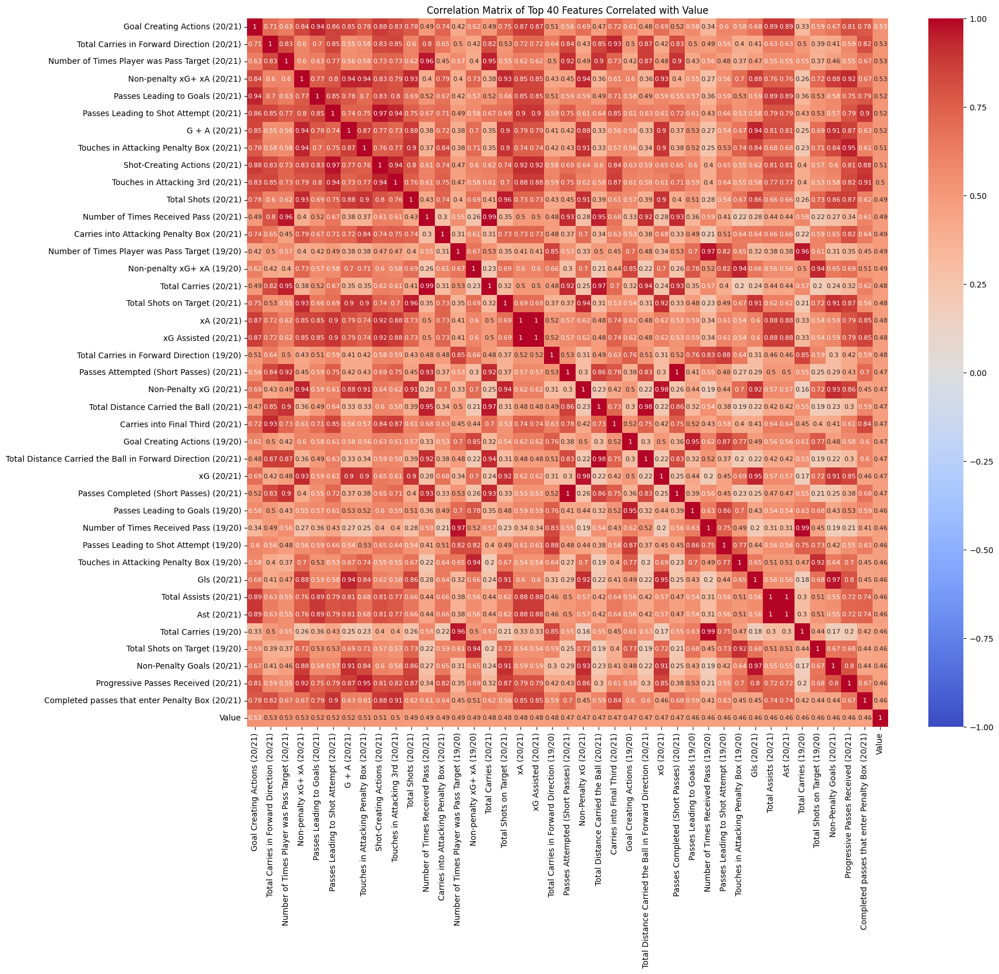

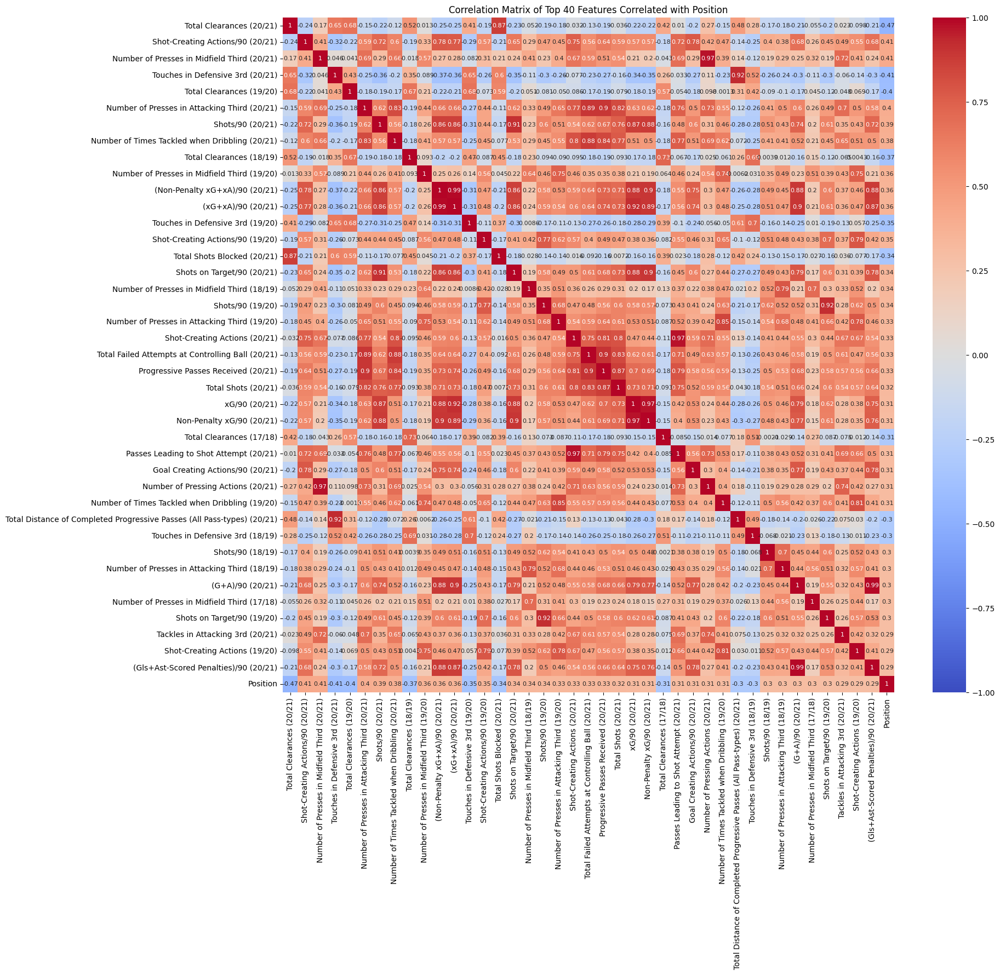

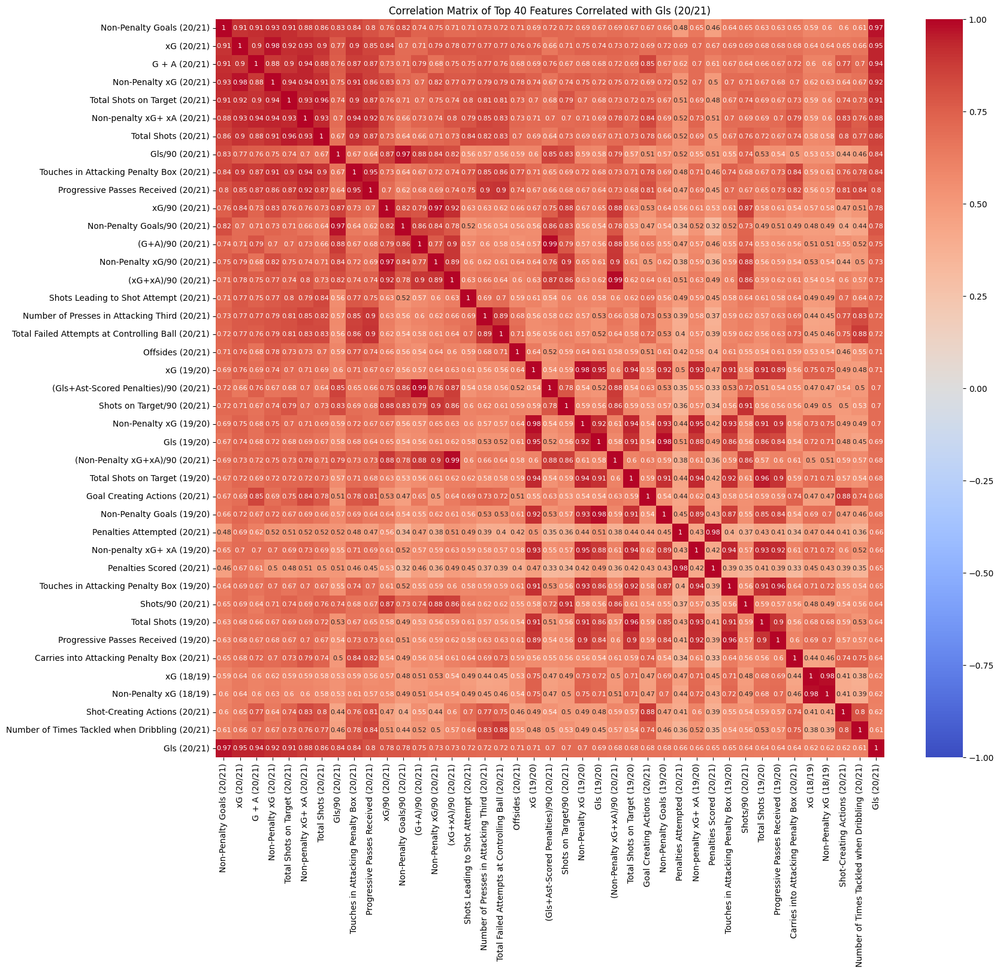

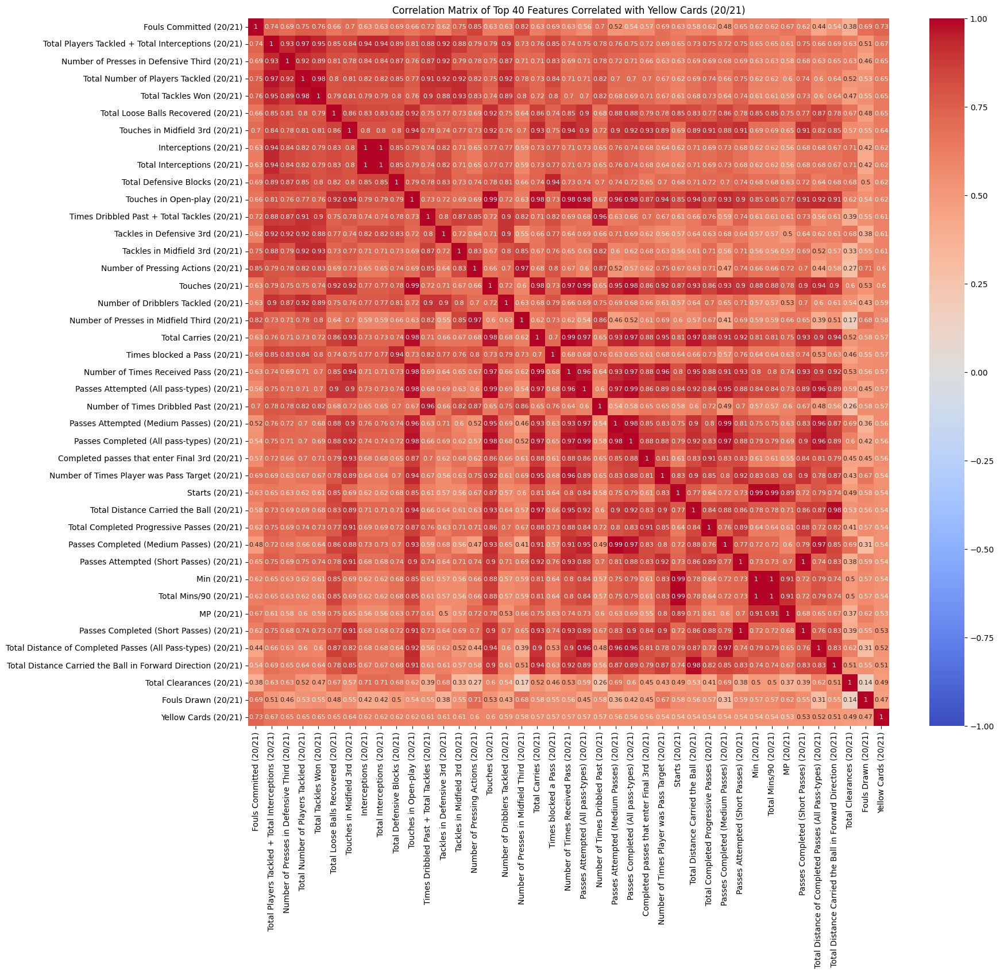

In [15]:
target_features = ['Value', 'Position', 'Gls (20/21)', 'Yellow Cards (20/21)']
corr_matrix = remove_fail_rows(data_for_corr_filled).corr()
for target_feat in target_features:
 red_corr_matrix = get_top_n_corr_for_feature(corr_matrix, target_feat, 40)
 plot_reduced_corr_matrix(red_corr_matrix, target_feat, 40)

In [16]:
data_for_corr_dropped = data_dropped.drop(columns = ["Player", "Club"])
data_for_corr_dropped.head()

,Age,Position,Nation,Value,Contract Years Left,League,MP (20/21),Starts (20/21),Min (20/21),Total Mins/90 (20/21),...,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_91.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_92.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_93.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_94.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_95.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_96.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_97.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_98.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_99.0,Times Squad gained Possession within 5 seconds of Pressing Actions (17/18)_nan
0,22,3,32,144000000,1,3,31.0,27.0,2380.0,26.4,...,0,0,0,0,0,0,0,0,0,0
2,28,3,29,108000000,3,4,35.0,35.0,3082.0,34.2,...,0,0,0,1,0,0,0,0,0,0
3,21,3,29,90000000,5,4,26.0,24.0,2062.0,22.9,...,0,0,0,0,0,0,0,0,0,0
4,29,3,28,90000000,2,4,37.0,34.0,3078.0,34.2,...,0,0,0,0,0,0,0,0,0,0
5,29,3,11,90000000,4,3,18.0,15.0,1415.0,15.7,...,0,0,0,0,0,0,0,0,0,0


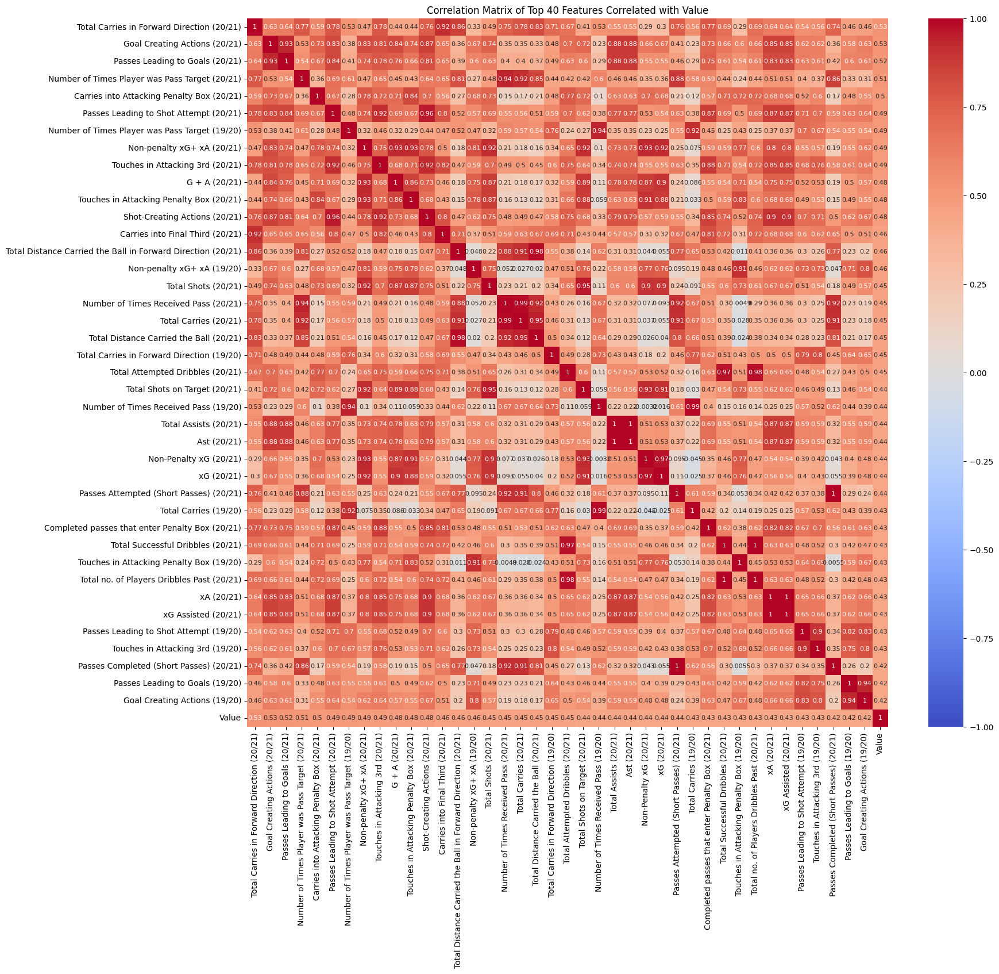

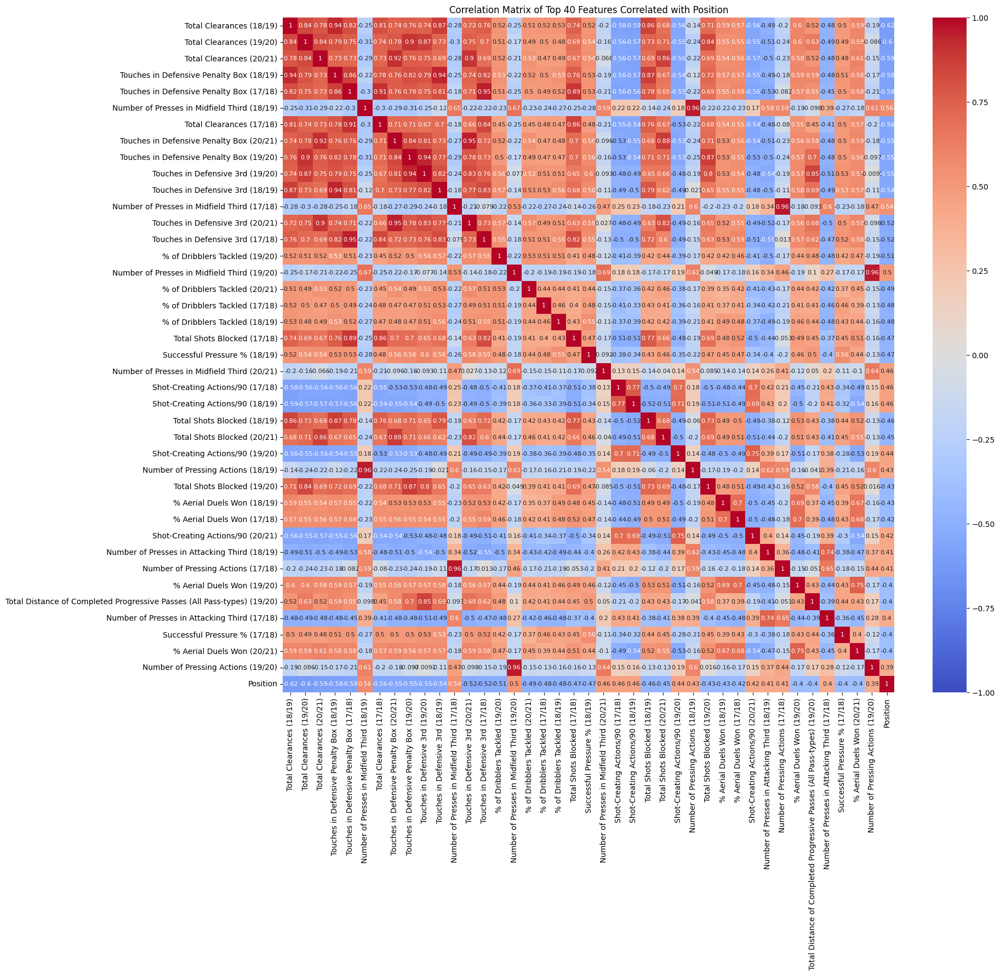

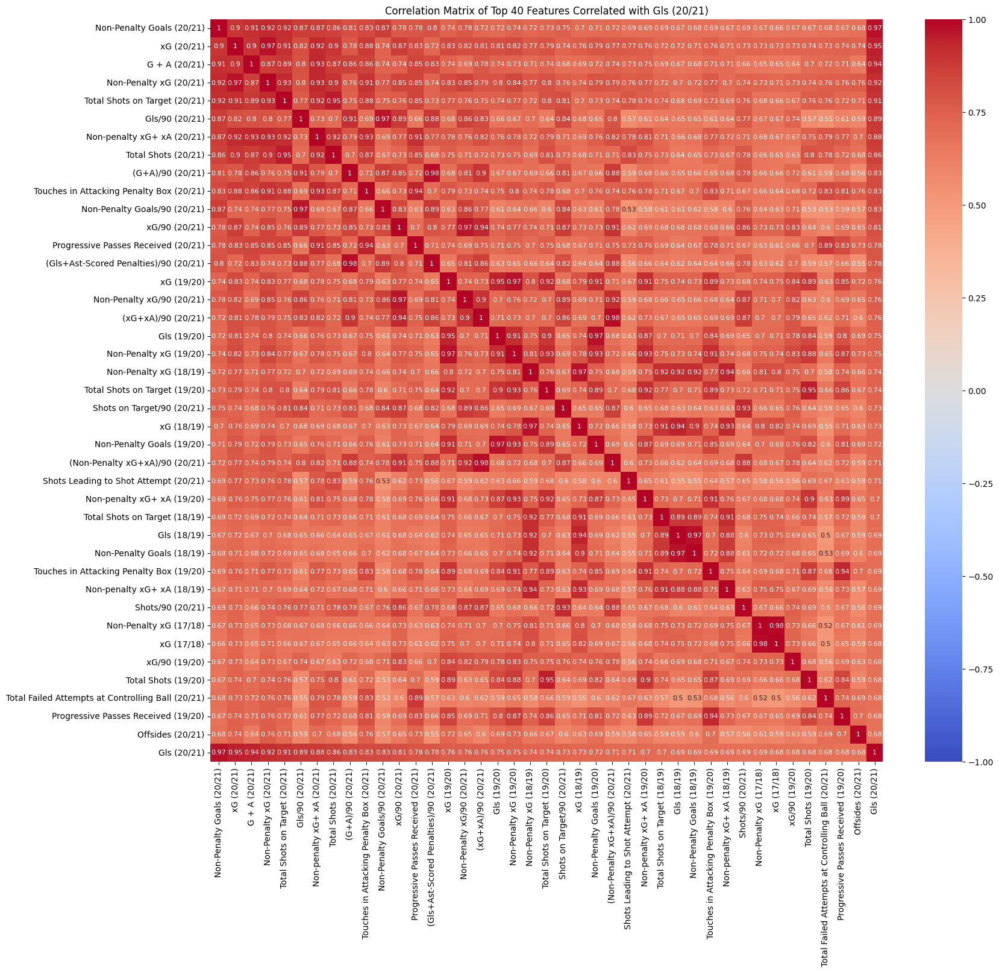

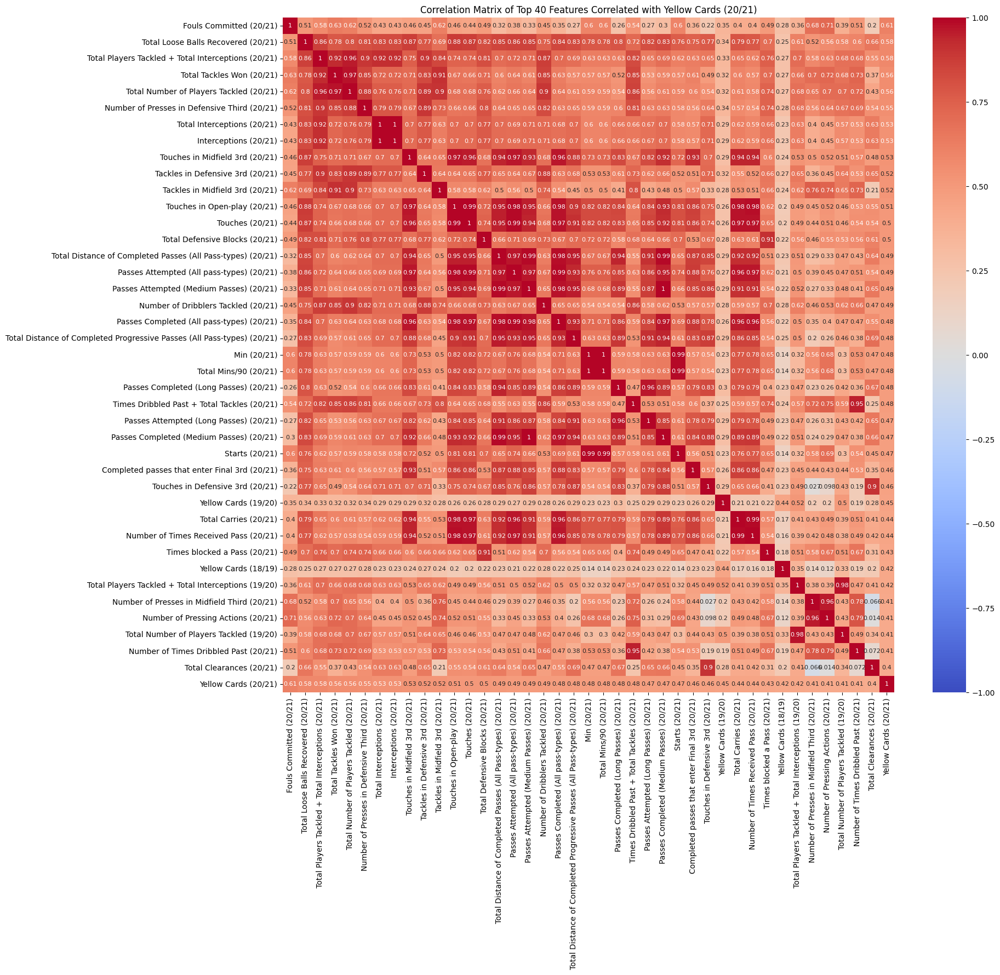

In [17]:
corr_matrix = remove_fail_rows(data_for_corr_dropped).corr()
for target_feat in target_features:
 red_corr_matrix = get_top_n_corr_for_feature(corr_matrix, target_feat, 40)
 plot_reduced_corr_matrix(red_corr_matrix, target_feat, 40)

## Plots Mostly Related to Player Position

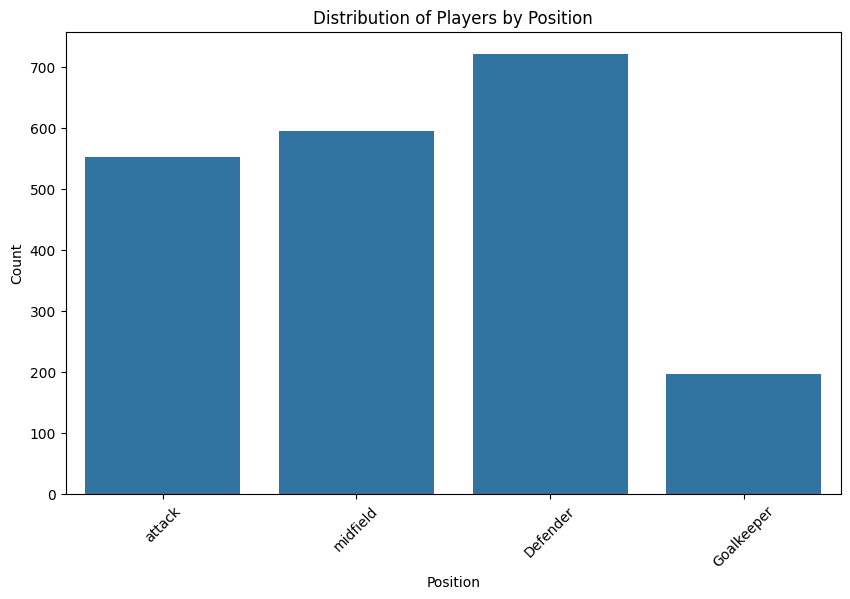

In [18]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Position', data=data)
plt.title('Distribution of Players by Position')
plt.xlabel('Position')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

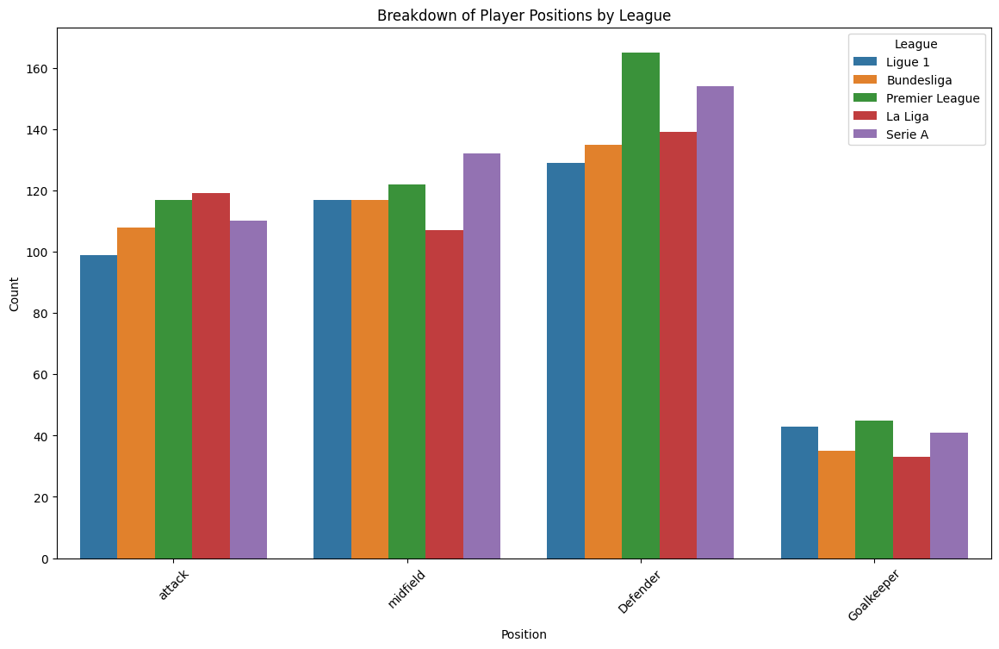

In [19]:
# Count plot of players by position for each league
plt.figure(figsize=(14, 8))
sns.countplot(x='Position', hue='League', data=data)
plt.title('Breakdown of Player Positions by League')
plt.xlabel('Position')
plt.ylabel('Count')
plt.legend(title='League')
plt.xticks(rotation=45)
plt.show()


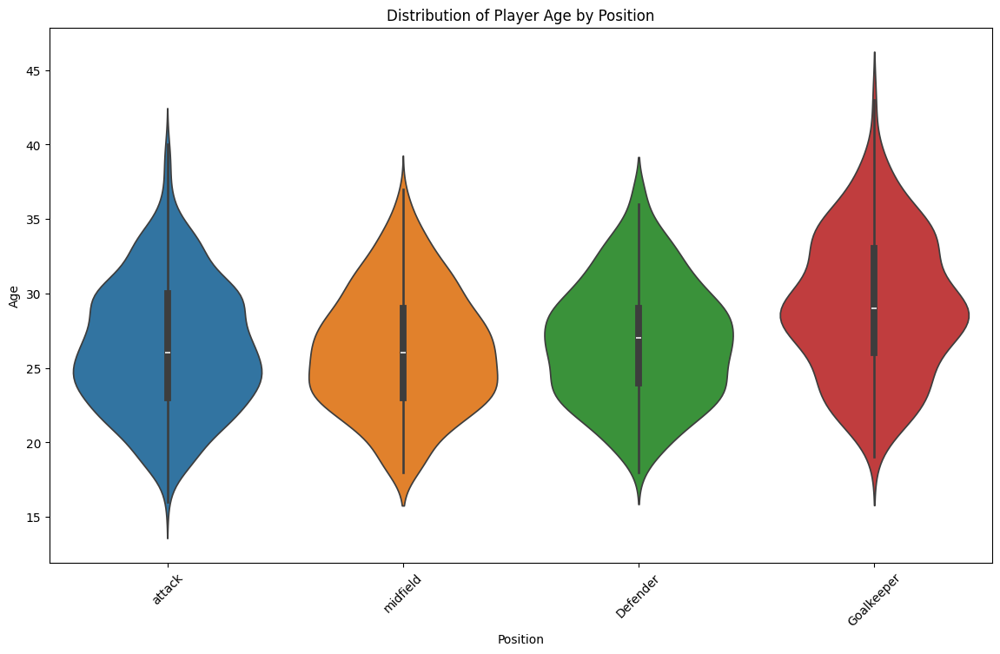

In [20]:
# Violin plot of age by position
plt.figure(figsize=(14, 8))
sns.violinplot(x='Position', y='Age', hue='Position', data=data)
plt.title('Distribution of Player Age by Position')
plt.xlabel('Position')
plt.ylabel('Age')
plt.xticks(rotation=45)
plt.show()


In [21]:
def identify_outliers(df, x_col, y_col):
    df['Outlier'] = False  # Add a new column to flag outliers
    for pos in df[x_col].unique():
        subset = df[df[x_col] == pos]
        q1 = subset[y_col].quantile(0.25)
        q3 = subset[y_col].quantile(0.75)
        iqr = q3 - q1
        fence_low = q1 - 1.5 * iqr
        fence_high = q3 + 1.5 * iqr
        outlier_condition = (subset[y_col] < fence_low) | (subset[y_col] > fence_high)
        df.loc[outlier_condition & (df[x_col] == pos), 'Outlier'] = True
    return df

data = identify_outliers(data, 'Position', 'Gls (20/21)')

fig = px.box(data, x='Position', y='Gls (20/21)', color='Outlier', color_discrete_map={True: 'red', False: 'blue'},
             hover_data=['Player'], points='all')
fig.update_layout(
    title='Goals (20/21) by Position',
    xaxis_title='Position',
    yaxis_title='Gls (20/21)'
)

fig.show()

     Category  Num_Outliers  Mean_Outlier_Value
0    Defender            60            3.766667
1  Goalkeeper             2            1.000000
2      attack            21           23.857143
3    midfield            28            9.857143


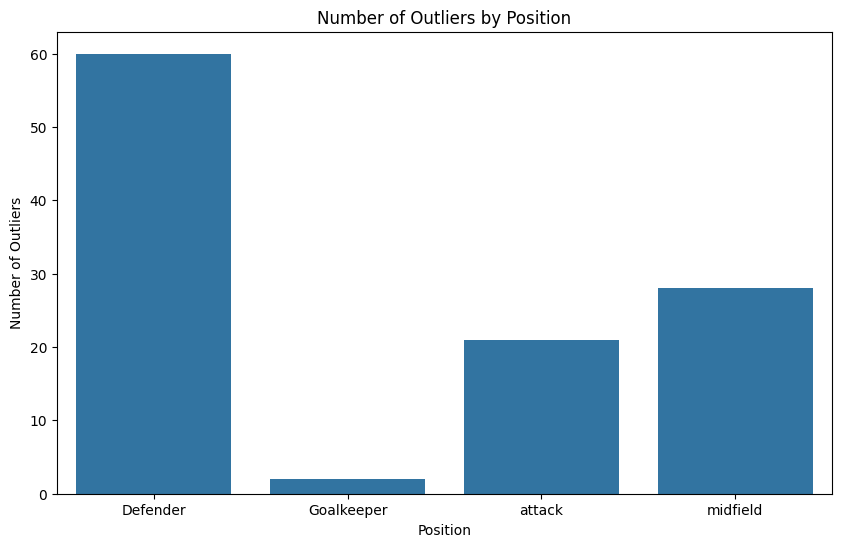

In [22]:
# Calculate summary statistics for outliers
def outlier_summary(df, category_col, y_col):
    summary = []

    # Group by the category and apply calculations only on flagged outliers
    grouped = df[df['Outlier']].groupby(category_col)

    for name, group in grouped:
        summary.append({
            'Category': name,
            'Num_Outliers': group.shape[0],
            'Mean_Outlier_Value': group[y_col].mean()
        })

    if not summary:  # If no outliers are found, create a DataFrame with the correct columns but empty
        return pd.DataFrame(columns=['Category', 'Num_Outliers', 'Mean_Outlier_Value'])
    else:
        return pd.DataFrame(summary)

# Get outlier summary
outlier_summary_df = outlier_summary(data, 'Position', 'Gls (20/21)')
print(outlier_summary_df)

# Plot summary statistics
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Num_Outliers', data=outlier_summary_df)
plt.title('Number of Outliers by Position')
plt.xlabel('Position')
plt.ylabel('Number of Outliers')
plt.show()


In [23]:
data = identify_outliers(data, 'Position', 'Value')
fig = px.box(data, x='Position', y='Value', color='Outlier', color_discrete_map={True: 'red', False: 'blue'},
             hover_data=['Player'], points='all')
fig.update_layout(
    title='Value by Position',
    xaxis_title='Position',
    yaxis_title='Value'
)

fig.show()

     Category  Num_Outliers  Mean_Outlier_Value
0    Defender            72        3.761250e+07
1  Goalkeeper            19        3.145263e+07
2      attack            45        6.160000e+07
3    midfield            40        5.539500e+07


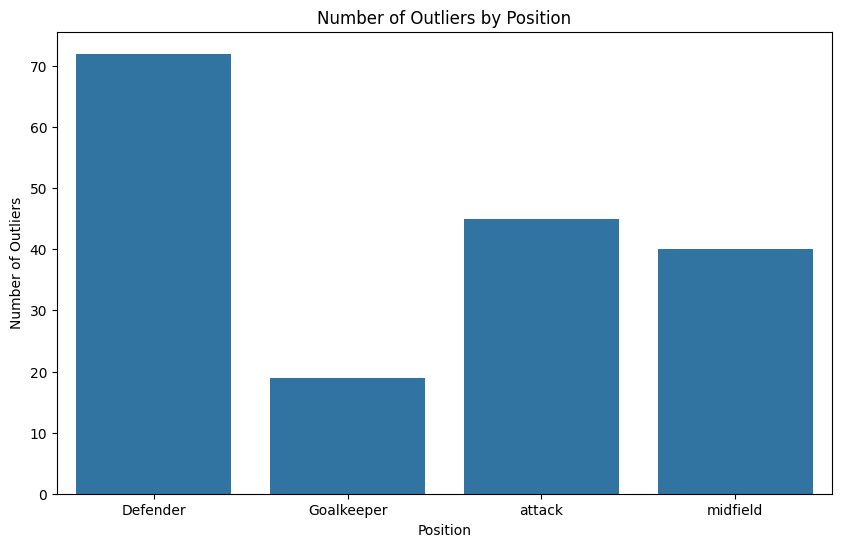

In [24]:
outlier_summary_df = outlier_summary(data, 'Position', 'Value')
print(outlier_summary_df)

# Plot summary statistics
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Num_Outliers', data=outlier_summary_df)
plt.title('Number of Outliers by Position')
plt.xlabel('Position')
plt.ylabel('Number of Outliers')
plt.show()


In [25]:
data = identify_outliers(data, 'Position', 'Ast (20/21)')
fig = px.box(data, x='Position', y='Ast (20/21)', color='Outlier', color_discrete_map={True: 'red', False: 'blue'},
             hover_data=['Player'], points='all')
fig.update_layout(
    title='Assists by Position',
    xaxis_title='Position',
    yaxis_title='Ast (20/21)'
)

fig.show()

     Category  Num_Outliers  Mean_Outlier_Value
0    Defender            77            4.545455
1  Goalkeeper             7            1.000000
2      attack            27           10.370370
3    midfield            22            9.954545


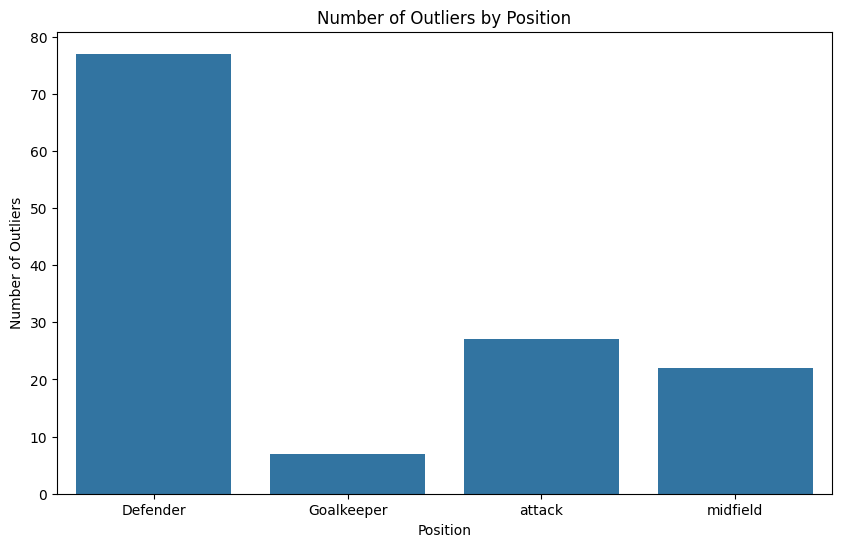

In [26]:
outlier_summary_df = outlier_summary(data, 'Position', 'Ast (20/21)')
print(outlier_summary_df)

# Plot summary statistics
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Num_Outliers', data=outlier_summary_df)
plt.title('Number of Outliers by Position')
plt.xlabel('Position')
plt.ylabel('Number of Outliers')
plt.show()


In [27]:
data = identify_outliers(data, 'Position', 'Non-Penalty Goals (20/21)')
fig = px.box(data, x='Position', y='Non-Penalty Goals (20/21)', color='Outlier', color_discrete_map={True: 'red', False: 'blue'},
             hover_data=['Player'], points='all')
fig.update_layout(
    title='Non-Pen Goals by Position',
    xaxis_title='Position',
    yaxis_title='Non-Penalty Goals (20/21)'
)

fig.show()

     Category  Num_Outliers  Mean_Outlier_Value
0    Defender            58            3.775862
1  Goalkeeper             1            1.000000
2      attack            15           21.200000
3    midfield            19            9.157895


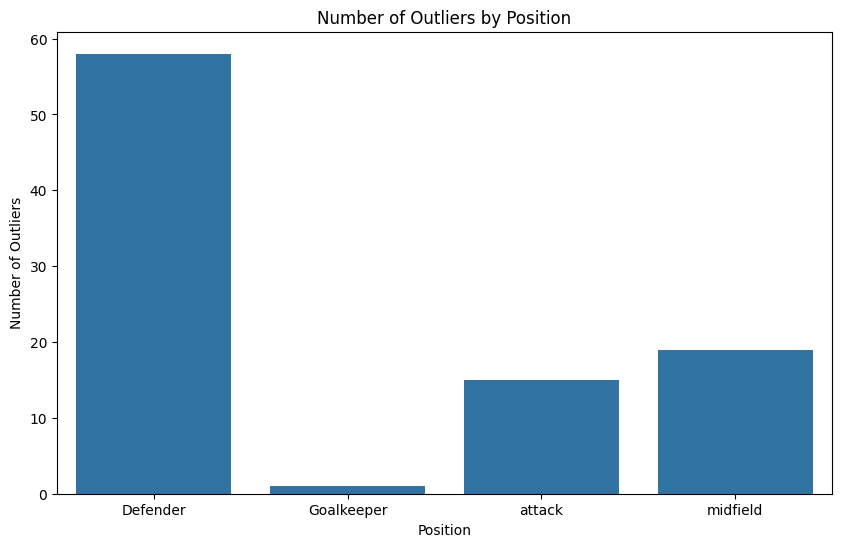

In [28]:
outlier_summary_df = outlier_summary(data, 'Position', 'Non-Penalty Goals (20/21)')
print(outlier_summary_df)

# Plot summary statistics
plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Num_Outliers', data=outlier_summary_df)
plt.title('Number of Outliers by Position')
plt.xlabel('Position')
plt.ylabel('Number of Outliers')
plt.show()

## Plots Mostly Related to Player Values

<ipython-input-29-a020f4c50887>:3: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




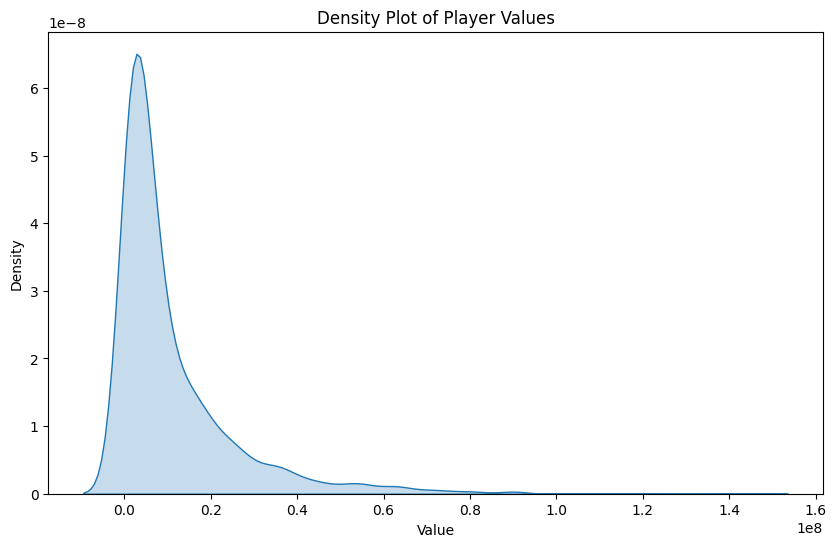

In [29]:
# Density plot of player values
plt.figure(figsize=(10, 6))
sns.kdeplot(data['Value'], shade=True)
plt.title('Density Plot of Player Values')
plt.xlabel('Value')
plt.ylabel('Density')
plt.show()


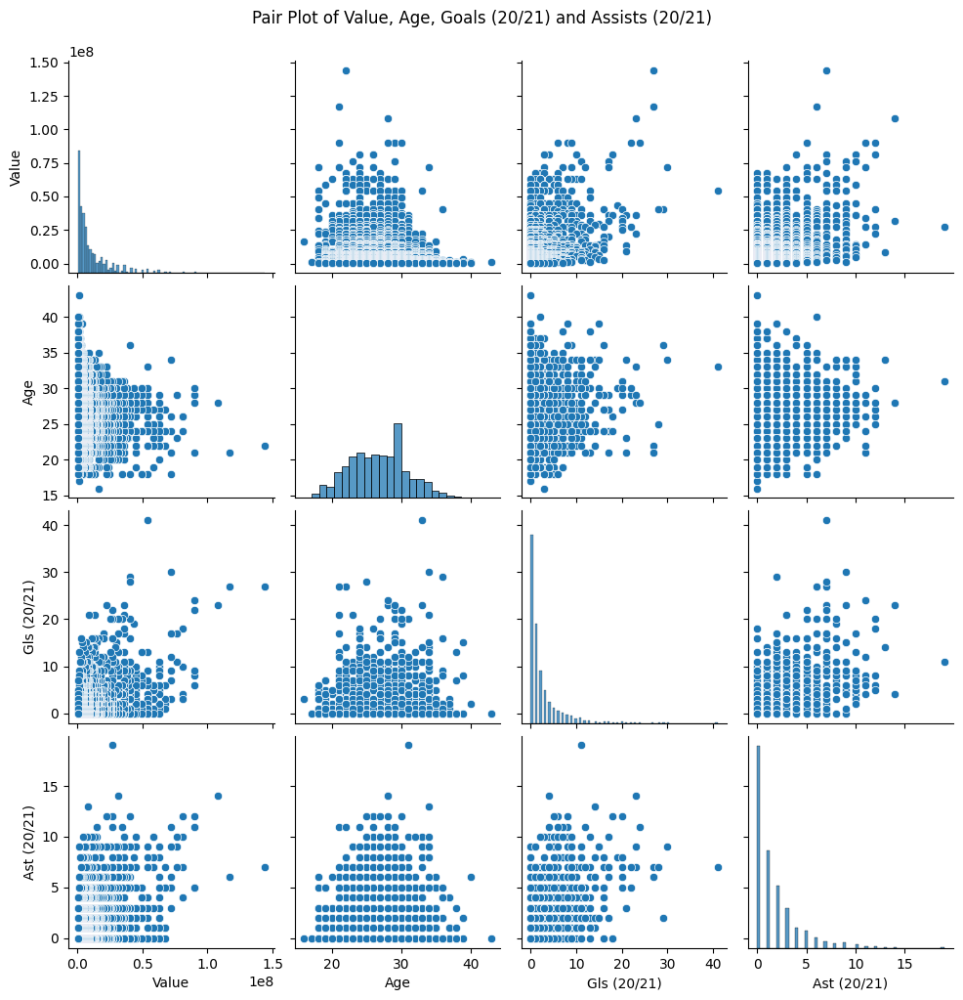

In [30]:
# Pair plot of selected features
selected_features = ['Value', 'Age', 'Gls (20/21)', 'Ast (20/21)']
sns.pairplot(data[selected_features])
plt.suptitle('Pair Plot of Value, Age, Goals (20/21) and Assists (20/21)', y=1.02)
plt.show()


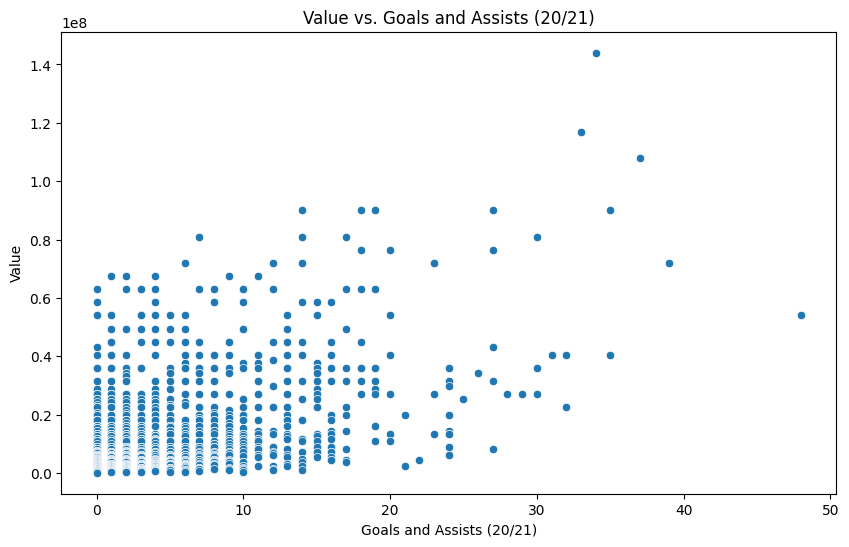

In [31]:
# Scatter plot of value vs. goals
plt.figure(figsize=(10, 6))
sns.scatterplot(x='G + A (20/21)', y='Value', data=data)
plt.title('Value vs. Goals and Assists (20/21)')
plt.xlabel('Goals and Assists (20/21)')
plt.ylabel('Value')
plt.show()


In [32]:
value_to_find = 'fail'

mask = data.isin([value_to_find])

# Extract the rows where the scraping failed for contract length
failed_rows = data[mask.any(axis=1)]

len(failed_rows)
rows_to_drop = data[mask.any(axis=1)].index
data_for_this_plot = data.drop(rows_to_drop)

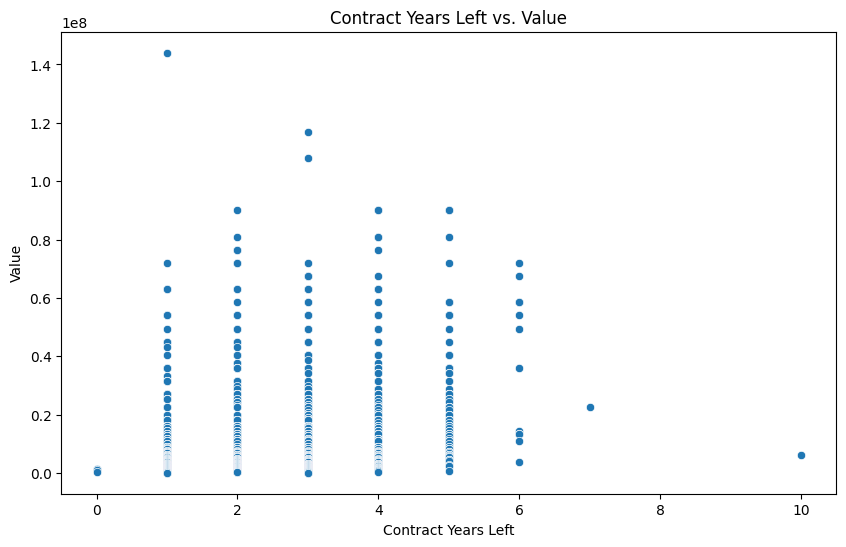

In [33]:
# Scatter plot of contract years left vs. value
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Contract Years Left', y='Value', data=data_for_this_plot)
plt.title('Contract Years Left vs. Value')
plt.xlabel('Contract Years Left')
plt.ylabel('Value')
plt.show()


In [34]:
top_nations = data['Nation'].value_counts()


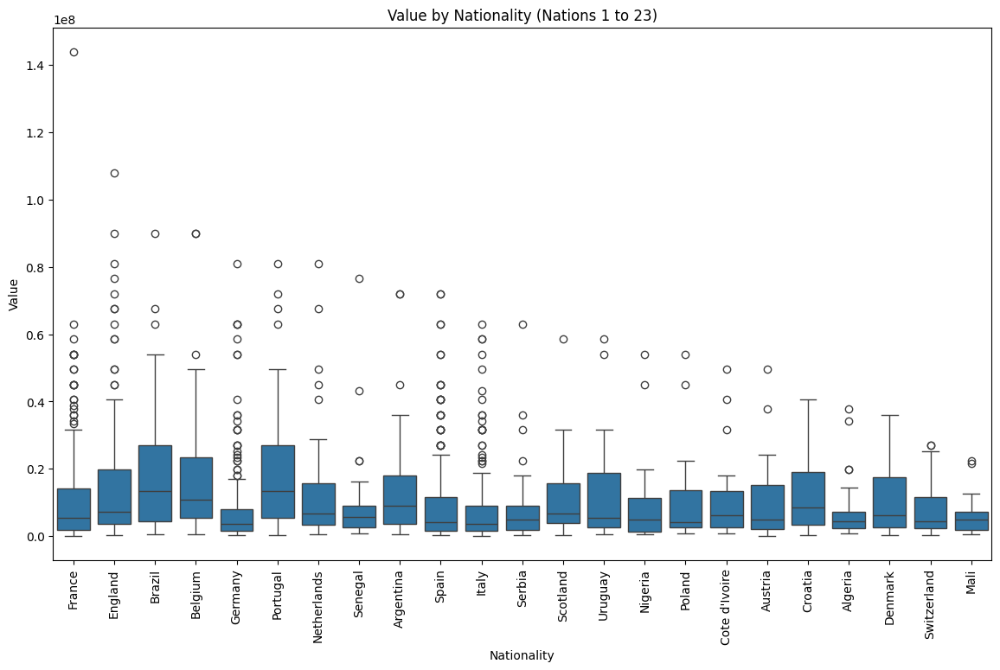

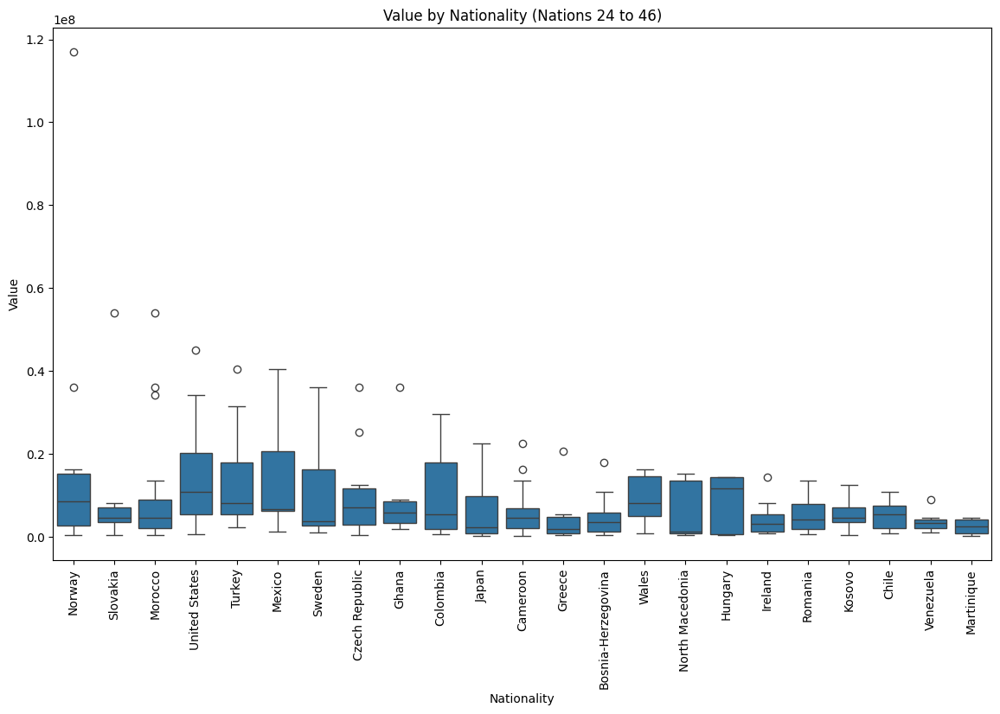

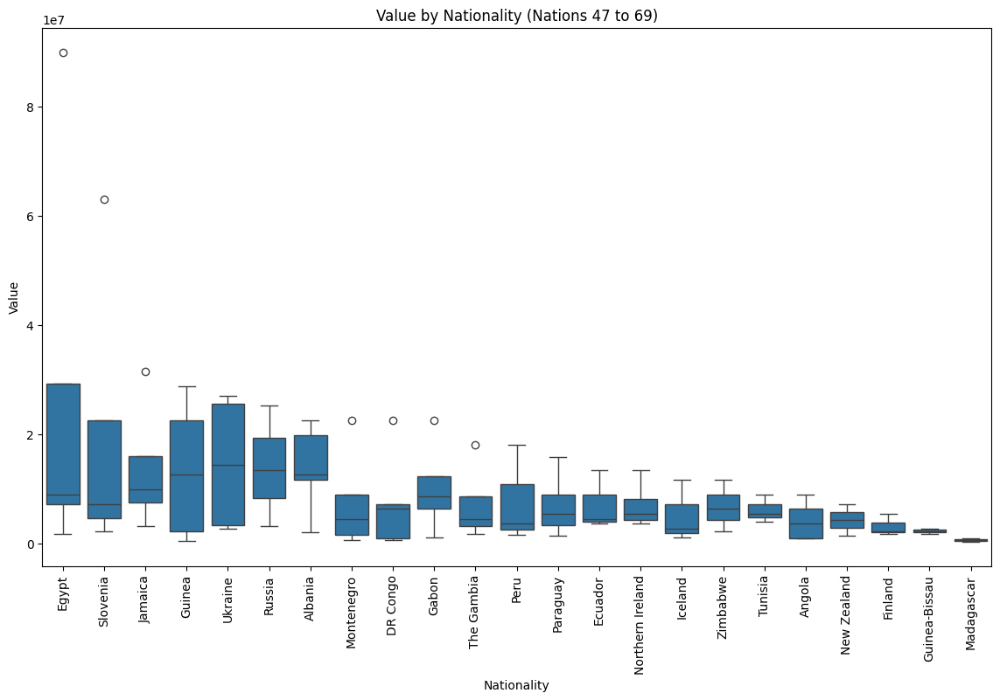

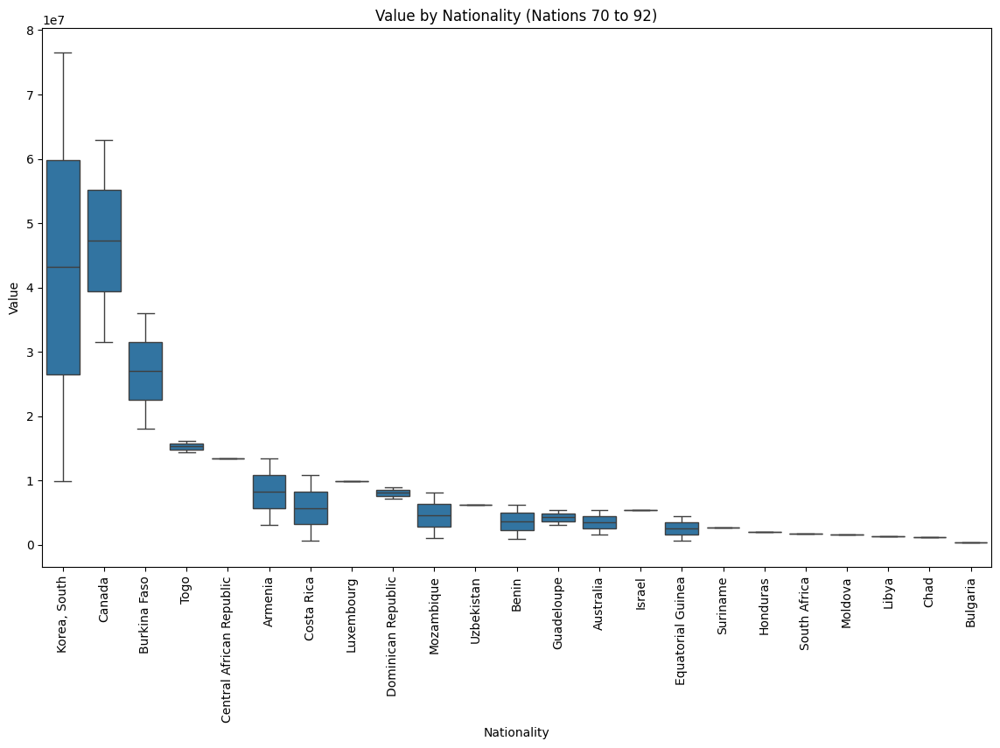

In [35]:
nation_counts = data['Nation'].value_counts()
chunk_size = 23
total_nations = len(nation_counts)
num_chunks = (total_nations + chunk_size - 1) // chunk_size
for i in range(num_chunks):
    start_idx = i * chunk_size
    end_idx = start_idx + chunk_size
    top_nations = nation_counts.index[start_idx:end_idx]

    plt.figure(figsize=(14, 8))
    sns.boxplot(x='Nation', y='Value', data=data[data['Nation'].isin(top_nations)])
    plt.title(f'Value by Nationality (Nations {start_idx+1} to {end_idx})')
    plt.xlabel('Nationality')
    plt.ylabel('Value')
    plt.xticks(rotation=90)
    plt.show()

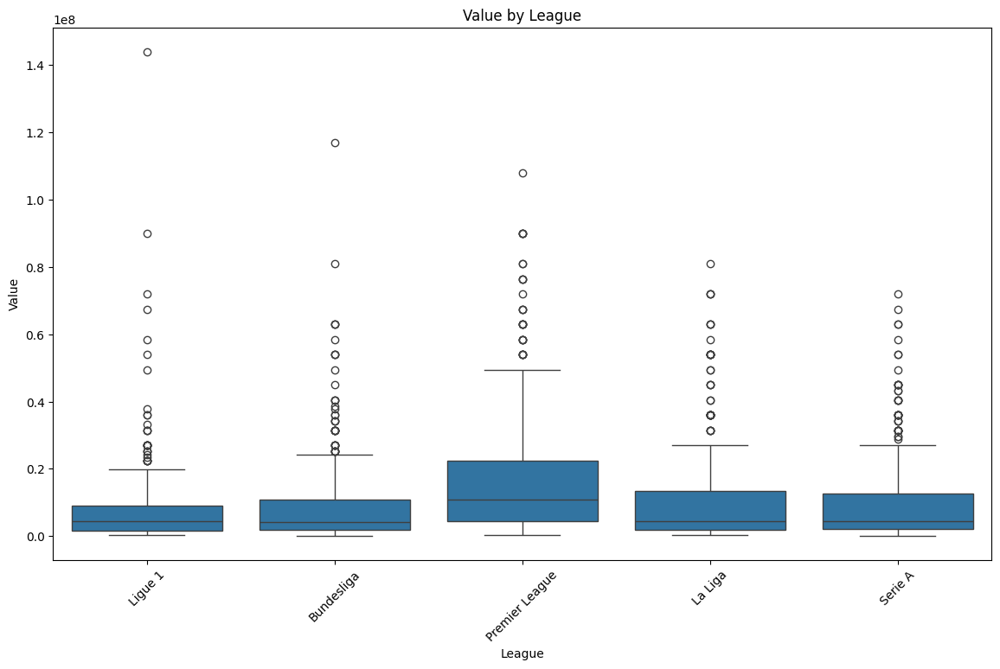

In [36]:
# Box plot of league vs. value
plt.figure(figsize=(14, 8))
sns.boxplot(x='League', y='Value', data=data)
plt.title('Value by League')
plt.xlabel('League')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()


<ipython-input-37-95d9564a5279>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




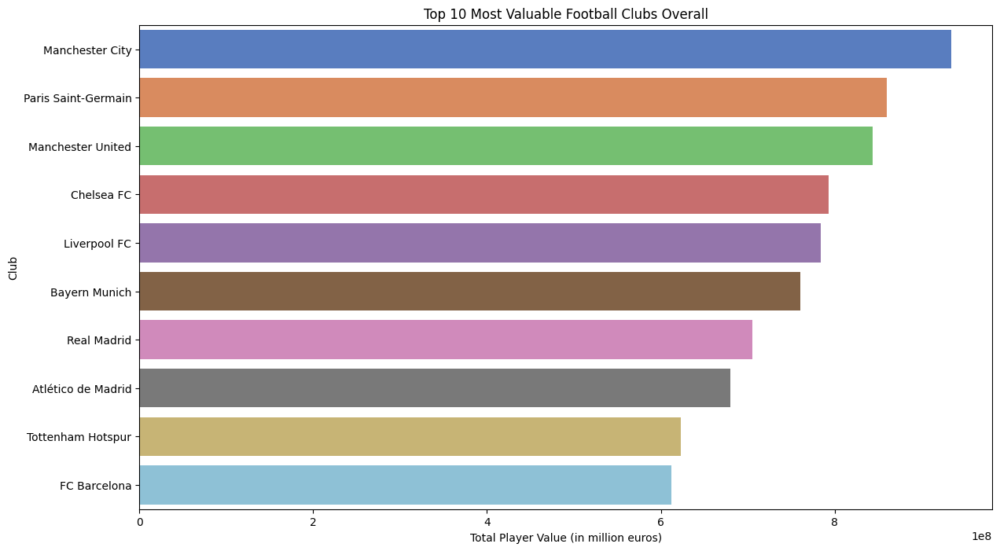

In [37]:
club_values = data.groupby('Club')['Value'].sum().reset_index().sort_values(by='Value', ascending=False)

# Select the top 20 most valuable clubs
top_clubs = club_values.head(10)

plt.figure(figsize=(14, 8))
sns.barplot(x='Value', y='Club', data=top_clubs, palette='muted')
plt.title('Top 10 Most Valuable Football Clubs Overall')
plt.xlabel('Total Player Value (in million euros)')
plt.ylabel('Club')
plt.show()

<ipython-input-38-ec62bed45d56>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




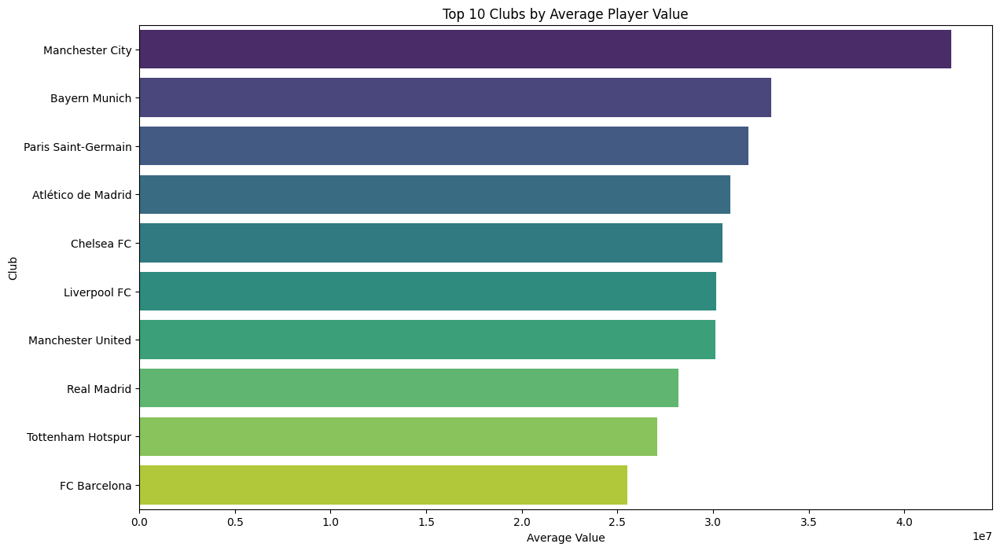

In [38]:
club_values = data.groupby('Club')['Value'].mean().reset_index().sort_values(by='Value', ascending=False).head(10)

plt.figure(figsize=(14, 8))
sns.barplot(x='Value', y='Club', data=club_values, palette='viridis')
plt.title('Top 10 Clubs by Average Player Value')
plt.xlabel('Average Value')
plt.ylabel('Club')
plt.show()


<ipython-input-39-9c4c840ca0ee>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




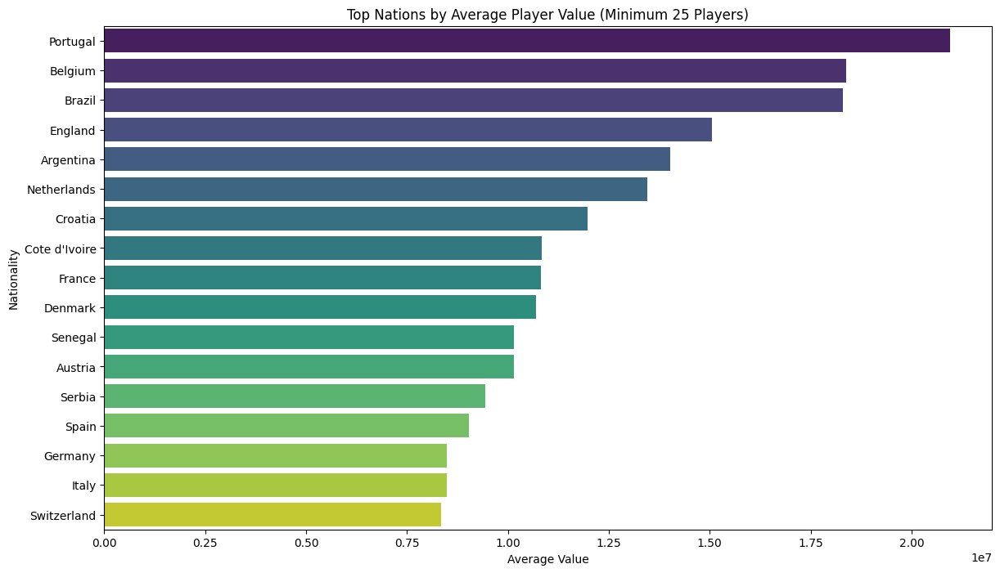

In [39]:
nation_counts = data['Nation'].value_counts()
valid_nations = nation_counts[nation_counts >= 25].index
data_filtered = data[data['Nation'].isin(valid_nations)]
nationality_values_filtered = data_filtered.groupby('Nation')['Value'].mean().reset_index().sort_values(by='Value', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x='Value', y='Nation', data=nationality_values_filtered, palette='viridis')
plt.title('Top Nations by Average Player Value (Minimum 25 Players)')
plt.xlabel('Average Value')
plt.ylabel('Nationality')
plt.show()

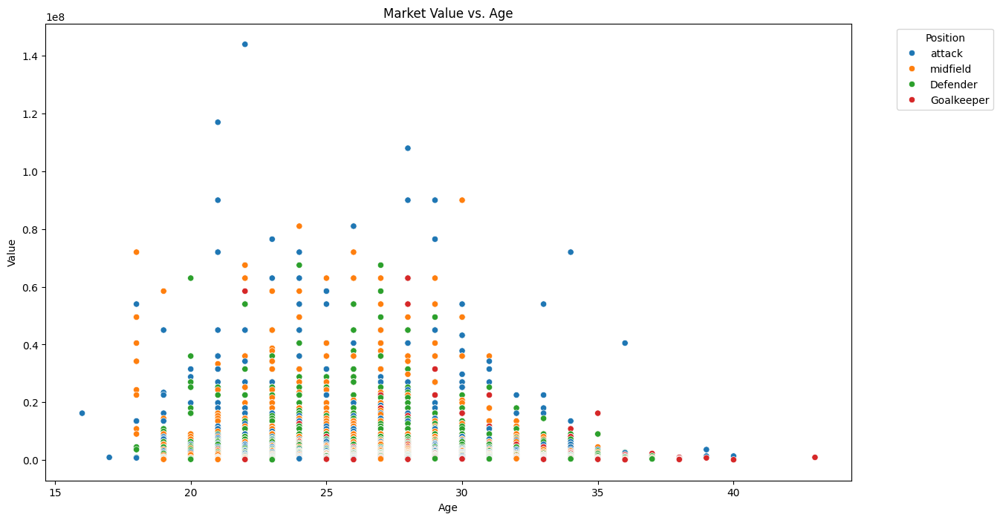

In [40]:
plt.figure(figsize=(14, 8))
sns.scatterplot(x='Age', y='Value', hue='Position', data=data)
plt.title('Market Value vs. Age')
plt.xlabel('Age')
plt.ylabel('Value')
plt.legend(title='Position', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


## Correlation Plots for Value, Position and Important Statistics

In [41]:
selected_columns = [col for col in data.columns if not (col.endswith('(17/18)') or col.endswith('(19/20)') or col.endswith('(18/19)'))]
for i in selected_columns:
  print(i)

Player
Club
Age
Position
Nation
Value
Contract Years Left
League
Squad (20/21)
MP (20/21)
Starts (20/21)
Min (20/21)
Total Mins/90 (20/21)
Gls (20/21)
Ast (20/21)
Non-Penalty Goals (20/21)
Penalties Scored (20/21)
Penalties Attempted (20/21)
Yellow Cards (20/21)
Red Cards (20/21)
Gls/90 (20/21)
Ast/90 (20/21)
(G+A)/90 (20/21)
Non-Penalty Goals/90 (20/21)
(Gls+Ast-Scored Penalties)/90 (20/21)
xG (20/21)
Non-Penalty xG (20/21)
xA (20/21)
Non-penalty xG+ xA (20/21)
xG/90 (20/21)
xA/90 (20/21)
(xG+xA)/90 (20/21)
Non-Penalty xG/90 (20/21)
(Non-Penalty xG+xA)/90 (20/21)
Total Shots (20/21)
Total Shots on Target (20/21)
Shots on Target% (20/21)
Shots/90 (20/21)
Shots on Target/90 (20/21)
Goals/Shots (20/21)
Goals/Shots on Target (20/21)
Avg Shot Distance (yds) (20/21)
Freekick Shots (20/21)
Non-Penalty xG/Shots (20/21)
Goals Scored minus xG (20/21)
Non-Penalty Goals Scored minus Non-Penalty xG (20/21)
Shot-Creating Actions (20/21)
Shot-Creating Actions/90 (20/21)
Passes Leading to Shot Attemp

In [42]:
passing_data = data[[
    'Age',
    'Position',
    'Value',
    'MP (20/21)',
    'Ast (20/21)',
    'Passes Completed (All pass-types) (20/21)',
    'Pass Completion % (All pass-types) (20/21)',
    'Passes Completed (Short Passes) (20/21)',
    'Pass Completion % (Short Passes) (20/21)',
    'Passes Completed (Medium Passes) (20/21)',
    'Pass Completion % (Medium Passes) (20/21)',
    'Passes Completed (Long Passes) (20/21)',
    'Pass Completion % (Long Passes) (20/21)',
    'Completed passes that enter Final 3rd (20/21)',
    'Completed passes that enter Penalty Box (20/21)',
    'Completed Crosses that enter Penalty Box (20/21)',
    'Total Assists (20/21)',
    'xG Assisted (20/21)',
    'Assist minus xG Assisted (20/21)',
    'Total Completed Progressive Passes (20/21)'
]]

defending_data = data[[
    'Age',
    'Position',
    'Value',
    'MP (20/21)',
    'Total Tackles Won (20/21)',
    'Tackles in Defensive 3rd (20/21)',
    'Tackles in Midfield 3rd (20/21)',
    '% of Dribblers Tackled (20/21)',
    'Number of Times Dribbled Past (20/21)',
    'Total Shots Blocked (20/21)',
    'Times blocked a Pass (20/21)',
    'Total Interceptions (20/21)',
    'Total Clearances (20/21)',
    'Mistakes leading to Opponent Shots (20/21)',
    'Own Goals (20/21)',
    'Total Loose Balls Recovered (20/21)',
    'Aerial Duel Won (20/21)',
    'Aerial Duel Lost (20/21)',
    '% Aerial Duels Won (20/21)',
    'Yellow Cards (20/21)',
    '2nd Yellow Cards (20/21)',
    'Red Cards (20/21)',
    'Number of Pressing Actions (20/21)',
    'Times Squad gained Possession within 5 seconds of Pressing Actions (20/21)',
    'Successful Pressure % (20/21)',
    'Total Defensive Blocks (20/21)',
    'Goal Saving Blocks (20/21)',
    'Total Players Tackled + Total Interceptions (20/21)'
]]


scoring_data = data[[
    'Age',
    'Position',
    'Value',
    'MP (20/21)',
    'Gls (20/21)',
    'Non-Penalty Goals (20/21)',
    'Penalties Scored (20/21)',
    'Penalties Attempted (20/21)',
    'Total Shots (20/21)',
    'Total Shots on Target (20/21)',
    'Goals/Shots (20/21)',
    'Goals/Shots on Target (20/21)',
    'Goal Creating Actions (20/21)',
    'Shot-Creating Actions (20/21)',
    'Total Attempted Dribbles (20/21)',
    'Dribble Success % (20/21)',
    'Number of Times Tackled when Dribbling (20/21)',
    'Number of Times Player was Pass Target (20/21)',
    '% of Times Successfully Received Pass (20/21)',
    'Progressive Passes Received (20/21)',
    'Goals Scored minus xG (20/21)',
    'Non-Penalty Goals Scored minus Non-Penalty xG (20/21)'
]]



In [43]:
passing_data_extended = data[['Age', 'Position', 'Value']]

seasons = ['20/21', '19/20', '18/19', '17/18']
for season in seasons:
    passing_data_extended = passing_data_extended.join(data[[f'MP ({season})',
                                                             f'Ast ({season})',
                                                             f'Passes Completed (All pass-types) ({season})',
                                                             f'Pass Completion % (All pass-types) ({season})',
                                                             f'Passes Completed (Short Passes) ({season})',
                                                             f'Pass Completion % (Short Passes) ({season})',
                                                             f'Passes Completed (Medium Passes) ({season})',
                                                             f'Pass Completion % (Medium Passes) ({season})',
                                                             f'Passes Completed (Long Passes) ({season})',
                                                             f'Pass Completion % (Long Passes) ({season})',
                                                             f'Completed passes that enter Final 3rd ({season})',
                                                             f'Completed passes that enter Penalty Box ({season})',
                                                             f'Completed Crosses that enter Penalty Box ({season})'
                                                            ]], how='left')

defending_data_extended = data[['Age', 'Position', 'Value']]
for season in seasons:
    defending_data_extended = defending_data_extended.join(data[[f'MP ({season})',
                                                                 f'Total Tackles Won ({season})',
                                                                 f'Tackles in Defensive 3rd ({season})',
                                                                 f'Tackles in Midfield 3rd ({season})',
                                                                 f'% of Dribblers Tackled ({season})',
                                                                 f'Number of Times Dribbled Past ({season})',
                                                                 f'Total Shots Blocked ({season})',
                                                                 f'Times blocked a Pass ({season})',
                                                                 f'Total Interceptions ({season})',
                                                                 f'Total Clearances ({season})',
                                                                 f'Mistakes leading to Opponent Shots ({season})',
                                                                 f'Own Goals ({season})',
                                                                 f'Total Loose Balls Recovered ({season})',
                                                                 f'Aerial Duel Won ({season})',
                                                                 f'Aerial Duel Lost ({season})',
                                                                 f'% Aerial Duels Won ({season})',
                                                                 f'Yellow Cards ({season})',
                                                                 f'2nd Yellow Cards ({season})',
                                                                 f'Red Cards ({season})',
                                                                 f'Number of Pressing Actions ({season})',
                                                                 f'Times Squad gained Possession within 5 seconds of Pressing Actions ({season})',
                                                                 f'Successful Pressure % ({season})',
                                                                 f'Total Defensive Blocks ({season})',
                                                                 f'Goal Saving Blocks ({season})',
                                                                 f'Total Players Tackled + Total Interceptions ({season})'
                                                                ]], how='left')

scoring_data_extended = data[['Age', 'Position', 'Value']]

seasons = ['20/21', '19/20', '18/19', '17/18']
for season in seasons:
    scoring_data_extended = scoring_data_extended.join(data[[f'MP ({season})',
                                                             f'Gls ({season})',
                                                             f'Non-Penalty Goals ({season})',
                                                             f'Penalties Scored ({season})',
                                                             f'Penalties Attempted ({season})',
                                                             f'Total Shots ({season})',
                                                             f'Total Shots on Target ({season})',
                                                             f'Goals/Shots ({season})',
                                                             f'Goals/Shots on Target ({season})',
                                                             f'Goal Creating Actions ({season})',
                                                             f'Shot-Creating Actions ({season})',
                                                             f'Total Attempted Dribbles ({season})',
                                                             f'Dribble Success % ({season})',
                                                             f'Number of Times Tackled when Dribbling ({season})',
                                                             f'Number of Times Player was Pass Target ({season})',
                                                             f'% of Times Successfully Received Pass ({season})',
                                                             f'Progressive Passes Received ({season})',
                                                             f'Goals Scored minus xG ({season})',
                                                             f'Non-Penalty Goals Scored minus Non-Penalty xG ({season})'
                                                            ]], how='left')



<ipython-input-44-3ad88257a38a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



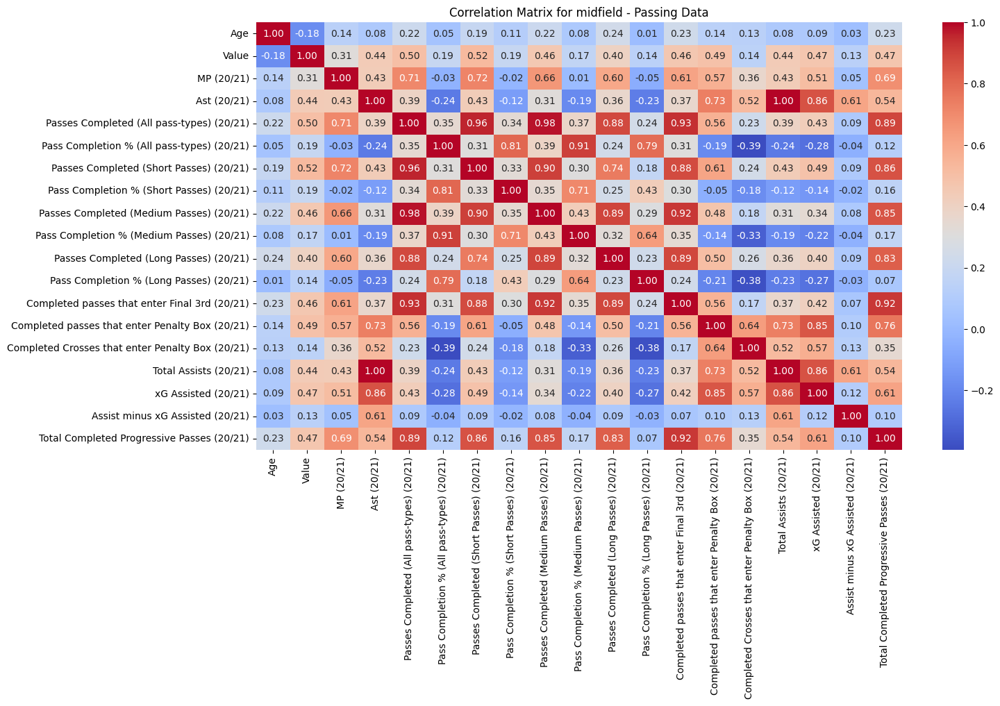

<ipython-input-44-3ad88257a38a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



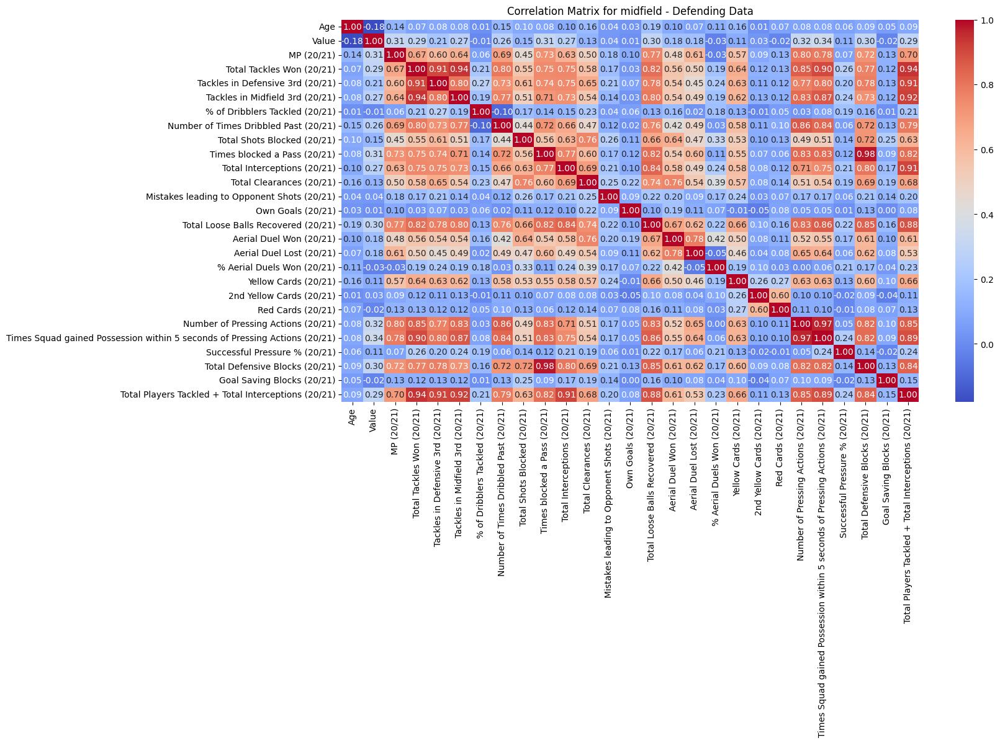

<ipython-input-44-3ad88257a38a>:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



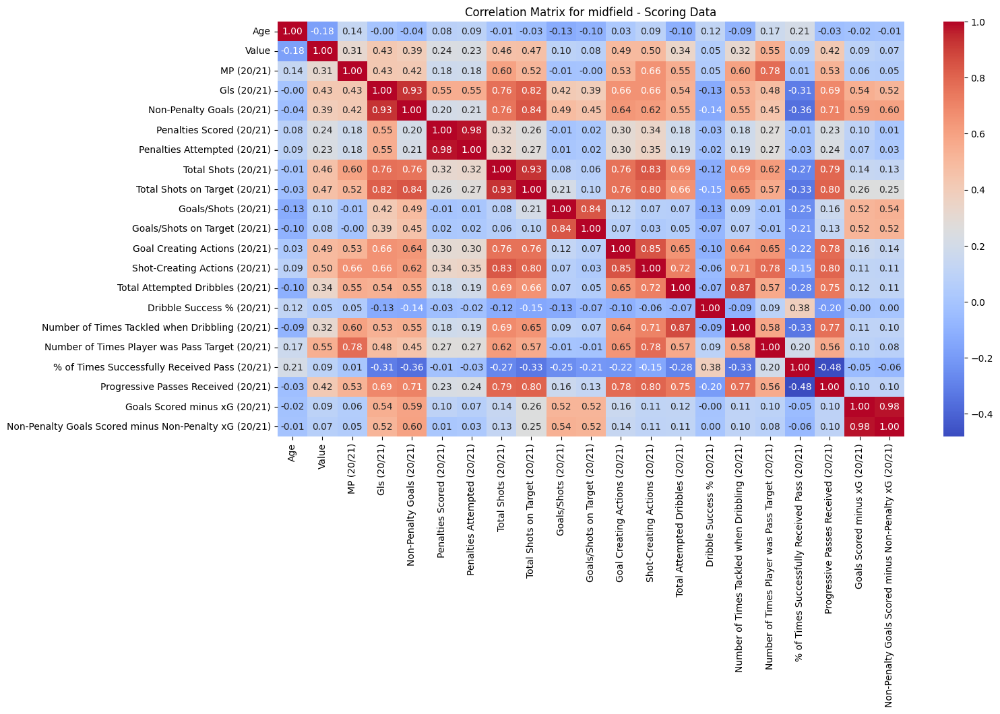

<ipython-input-44-3ad88257a38a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



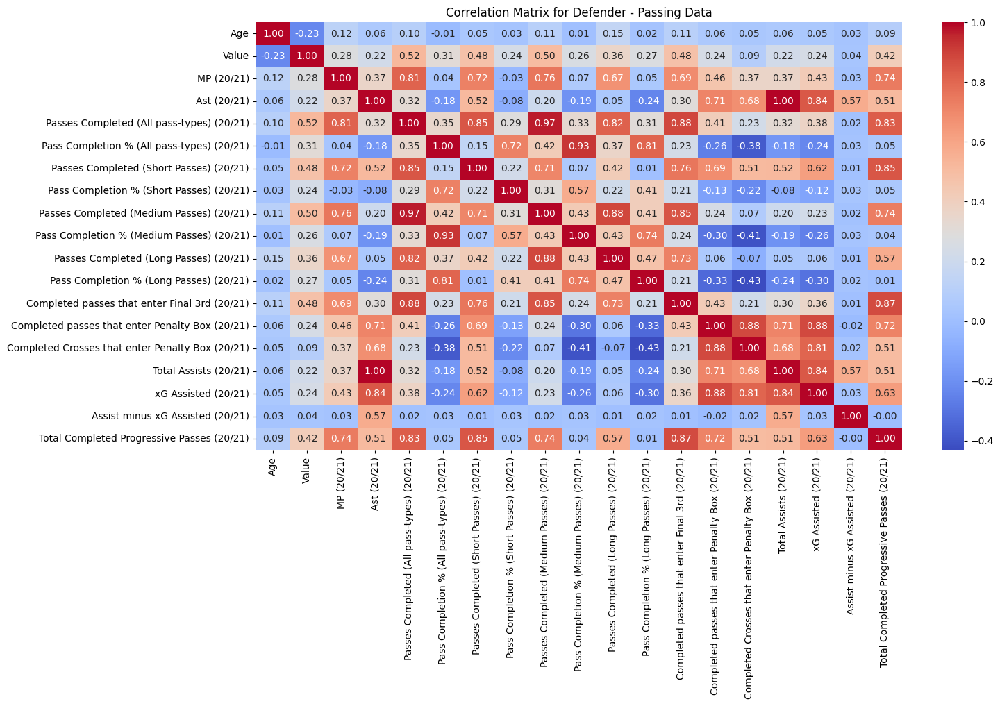

<ipython-input-44-3ad88257a38a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



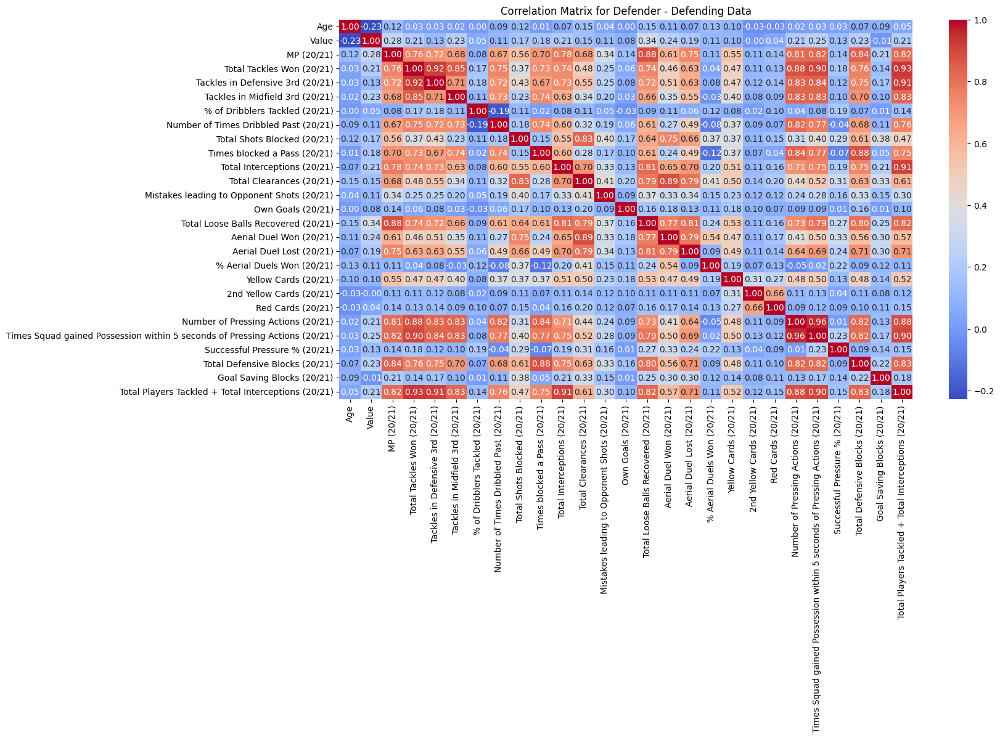

<ipython-input-44-3ad88257a38a>:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



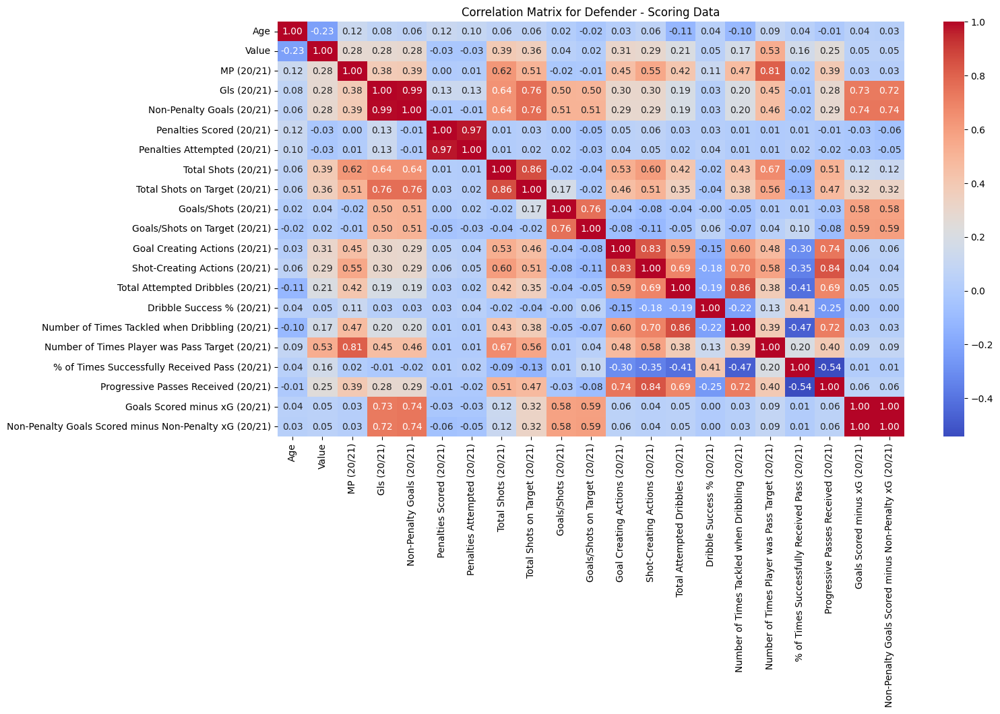

<ipython-input-44-3ad88257a38a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



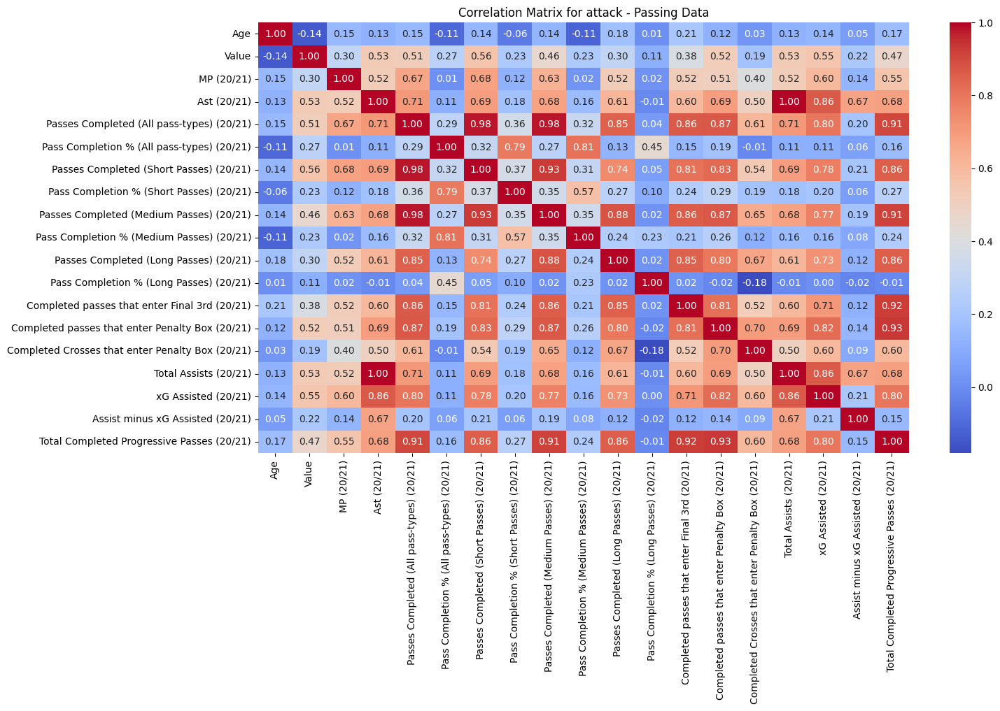

<ipython-input-44-3ad88257a38a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



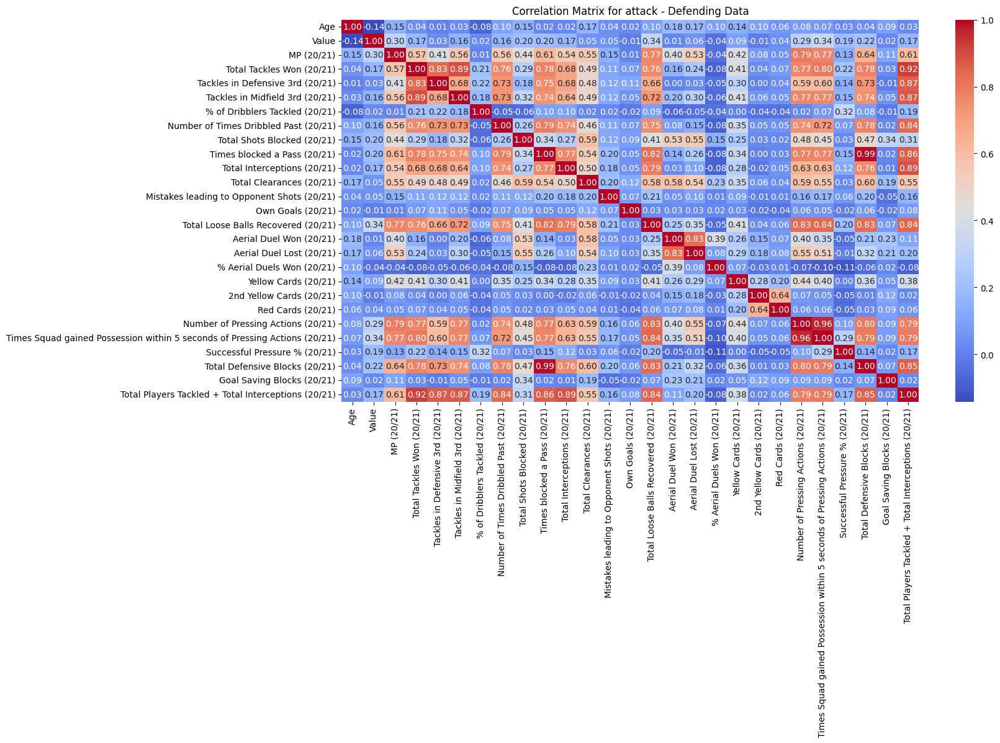

<ipython-input-44-3ad88257a38a>:23: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



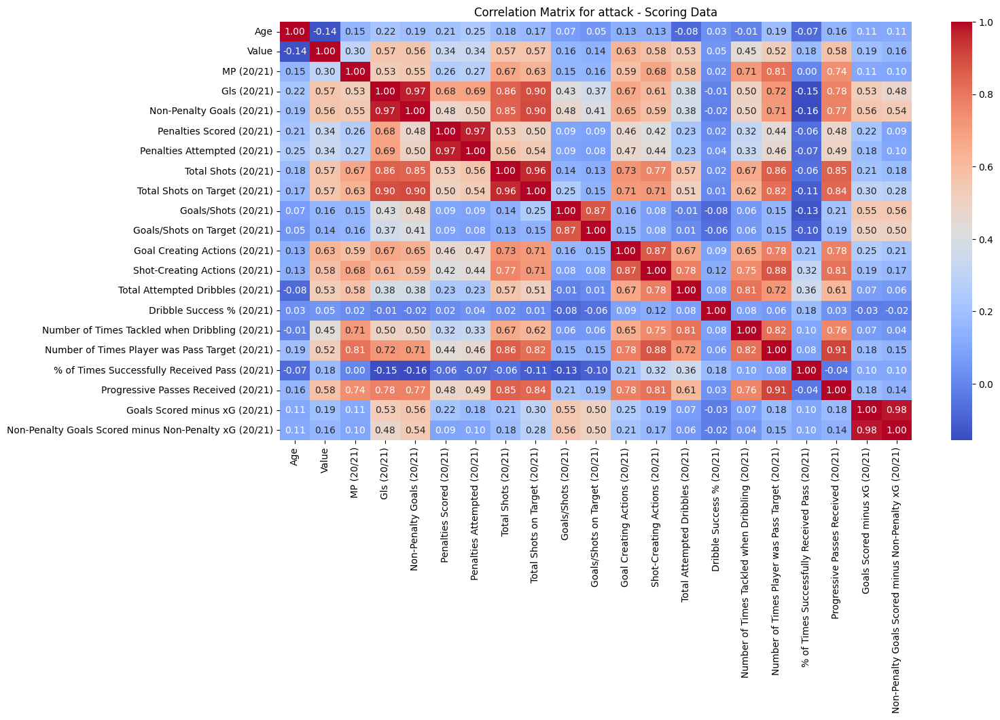

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

positions = ['midfield', 'Defender', 'attack']
for position in positions:
    aux_data = passing_data[passing_data['Position'] == position]
    aux_data.drop('Position', axis=1, inplace=True)
    aux_corr = aux_data.corr()
    plt.figure(figsize=(15, 8))
    plt.title(f'Correlation Matrix for {position} - Passing Data')
    sns.heatmap(aux_corr, annot=True, cmap='coolwarm', fmt=".2f")
    plt.show()

    aux_data = defending_data[defending_data['Position'] == position]
    aux_data.drop('Position', axis=1, inplace=True)
    aux_corr = aux_data.corr()
    plt.figure(figsize=(15, 8))
    plt.title(f'Correlation Matrix for {position} - Defending Data')
    sns.heatmap(aux_corr, annot=True, cmap='coolwarm', fmt=".2f")
    plt.show()

    aux_data = scoring_data[scoring_data['Position'] == position]
    aux_data.drop('Position', axis=1, inplace=True)
    aux_corr = aux_data.corr()
    plt.figure(figsize=(15, 8))
    plt.title(f'Correlation Matrix for {position} - Scoring Data')
    sns.heatmap(aux_corr, annot=True, cmap='coolwarm', fmt=".2f")
    plt.show()


In [45]:
def plot_interactive_heatmap(data, position, title):
    corr_matrix = data.corr()
    fig = px.imshow(corr_matrix, text_auto=True, aspect="auto", title=title, color_continuous_scale='Viridis')
    fig.update_layout(width=1000, height=1000)  # Increase the size of the plot
    fig.show()

In [46]:
aux_data = passing_data_extended[passing_data_extended['Position'] == 'midfield']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'midfield', 'Interactive Correlation Matrix for Midfield - Passing Data')



In [47]:
aux_data = passing_data_extended[passing_data_extended['Position'] == 'Defender']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'Defender', 'Interactive Correlation Matrix for Defender - Passing Data')



In [48]:
aux_data = passing_data_extended[passing_data_extended['Position'] == 'attack']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'attack', 'Interactive Correlation Matrix for Attack - Passing Data')


In [49]:
aux_data = defending_data_extended[defending_data_extended['Position'] == 'midfield']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'midfield', 'Interactive Correlation Matrix for Midfield - Defending Data')


In [50]:
aux_data = defending_data_extended[defending_data_extended['Position'] == 'Defender']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'Defender', 'Interactive Correlation Matrix for Defender - Defending Data')


In [51]:
aux_data = defending_data_extended[defending_data_extended['Position'] == 'attack']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'attack', 'Interactive Correlation Matrix for Attack - Defending Data')


In [52]:
aux_data = scoring_data_extended[scoring_data_extended['Position'] == 'midfield']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'midfield', 'Interactive Correlation Matrix for Midfield - Scoring Data')


In [53]:
aux_data = scoring_data_extended[scoring_data_extended['Position'] == 'Defender']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'Defender', 'Interactive Correlation Matrix for Defender - Scoring Data')


In [54]:
aux_data = scoring_data_extended[scoring_data_extended['Position'] == 'attack']
aux_data = aux_data.drop('Position', axis=1)

corr_matrix = aux_data.corr()

plot_interactive_heatmap(aux_data, 'attack', 'Interactive Correlation Matrix for Attack - Scoring Data')


Position: midfield
Group: passing


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



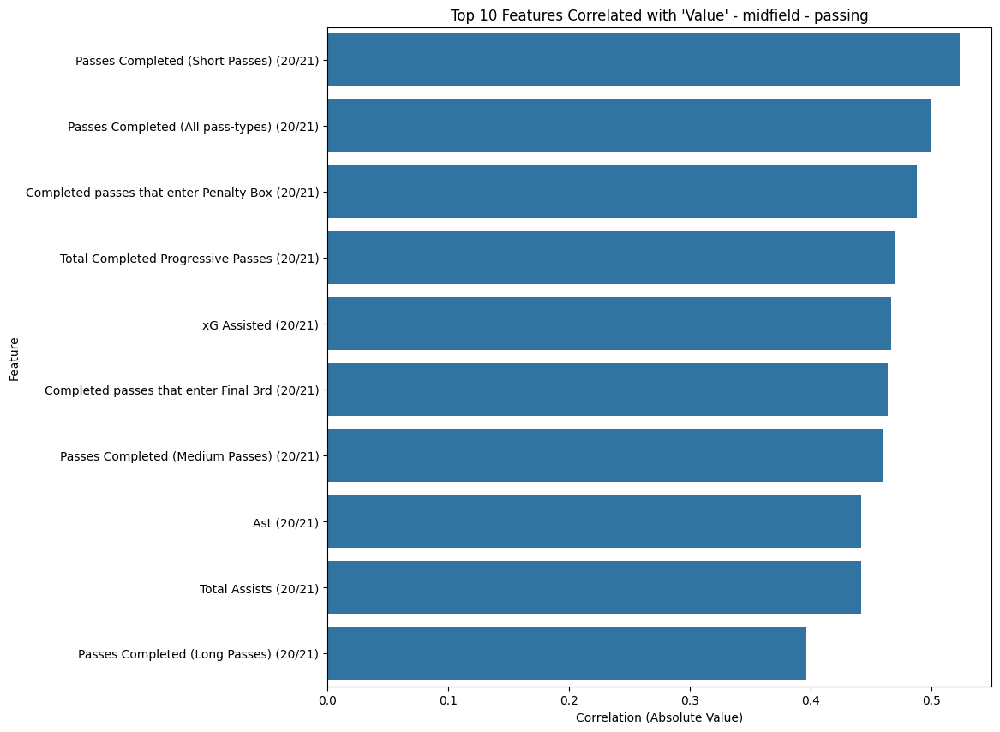

Group: defending


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



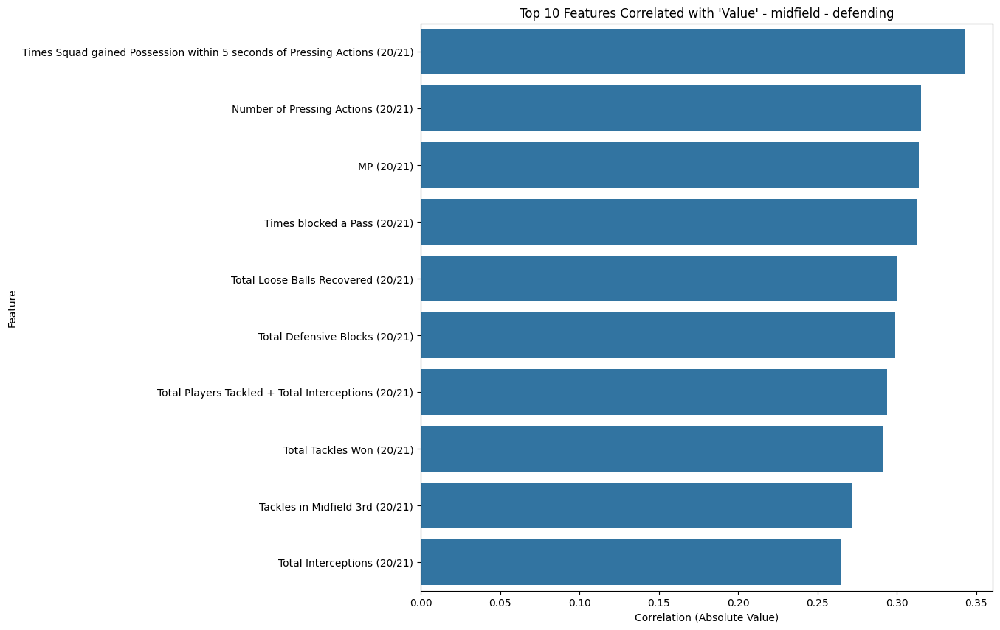

Group: scoring


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



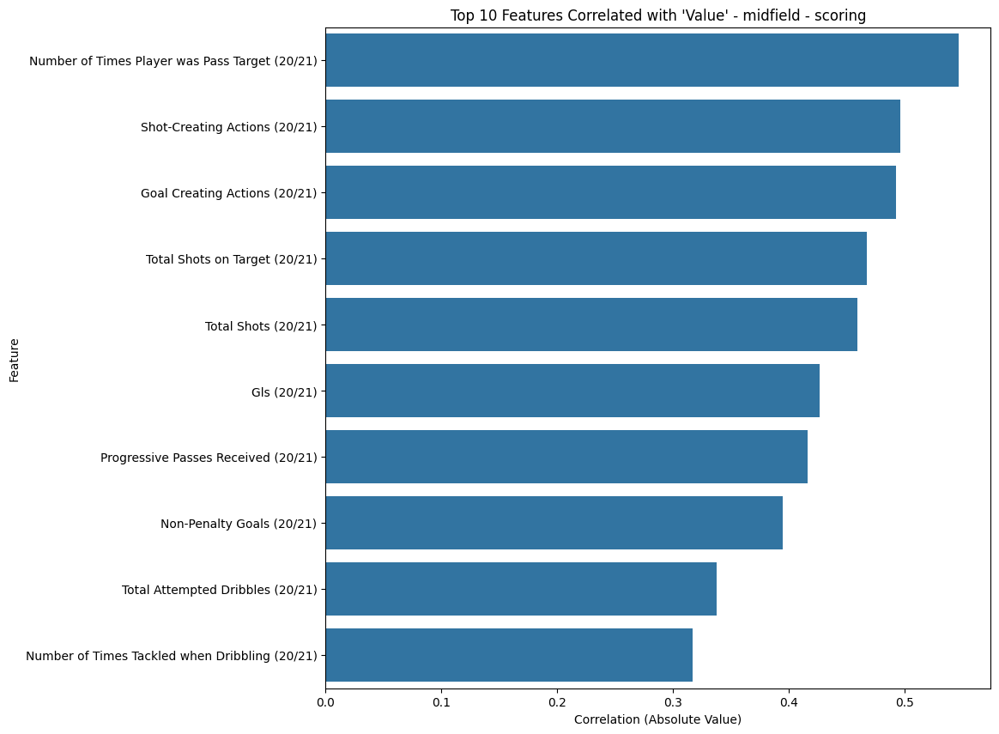

Position: Defender
Group: passing


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



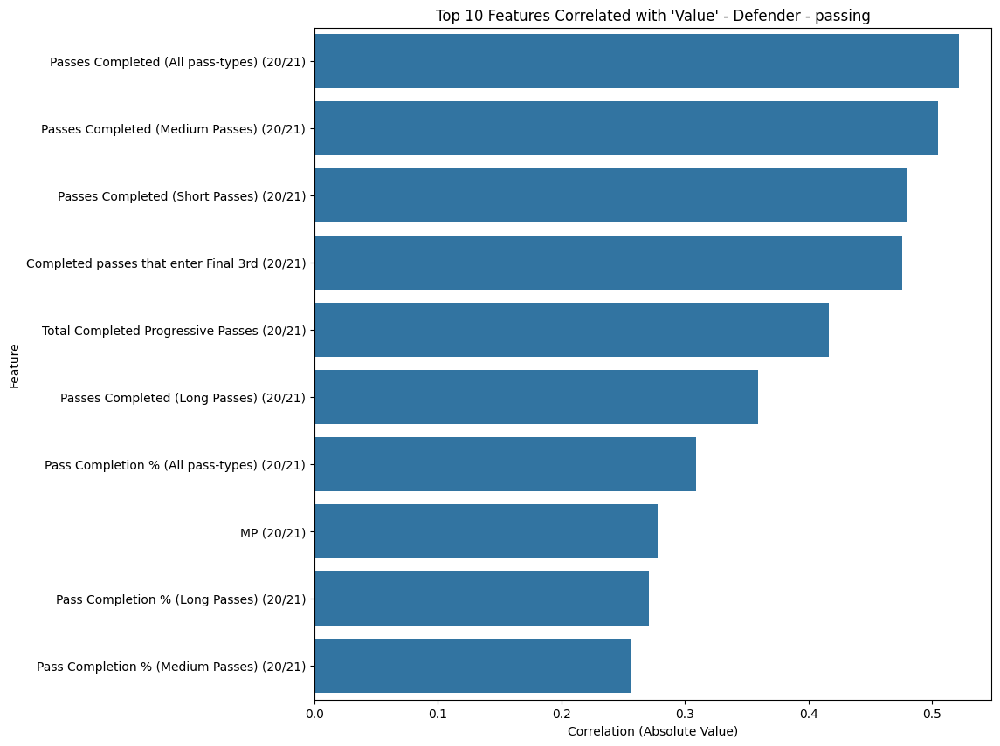

Group: defending


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



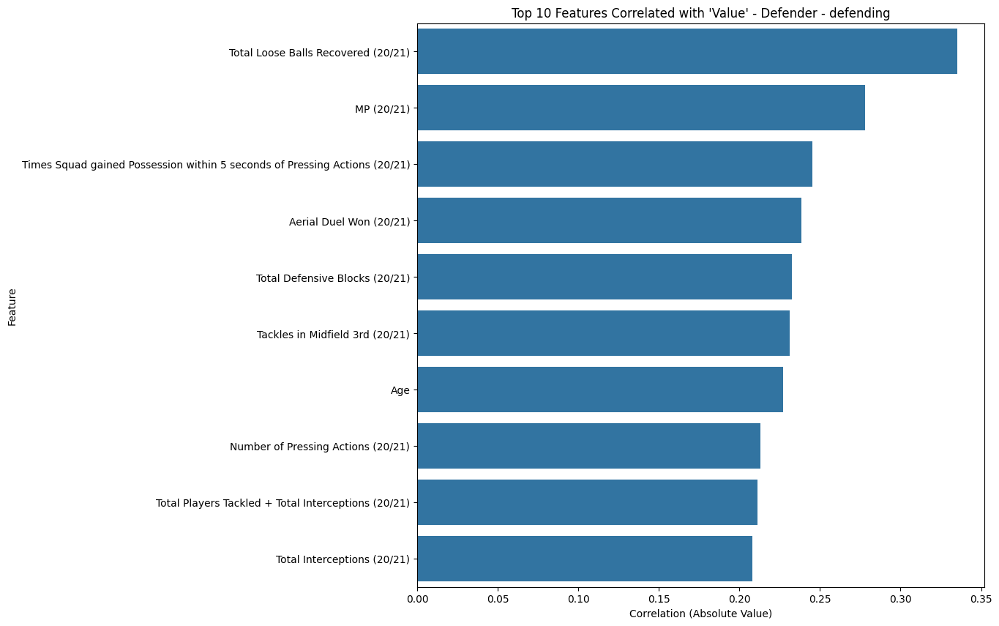

Group: scoring


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



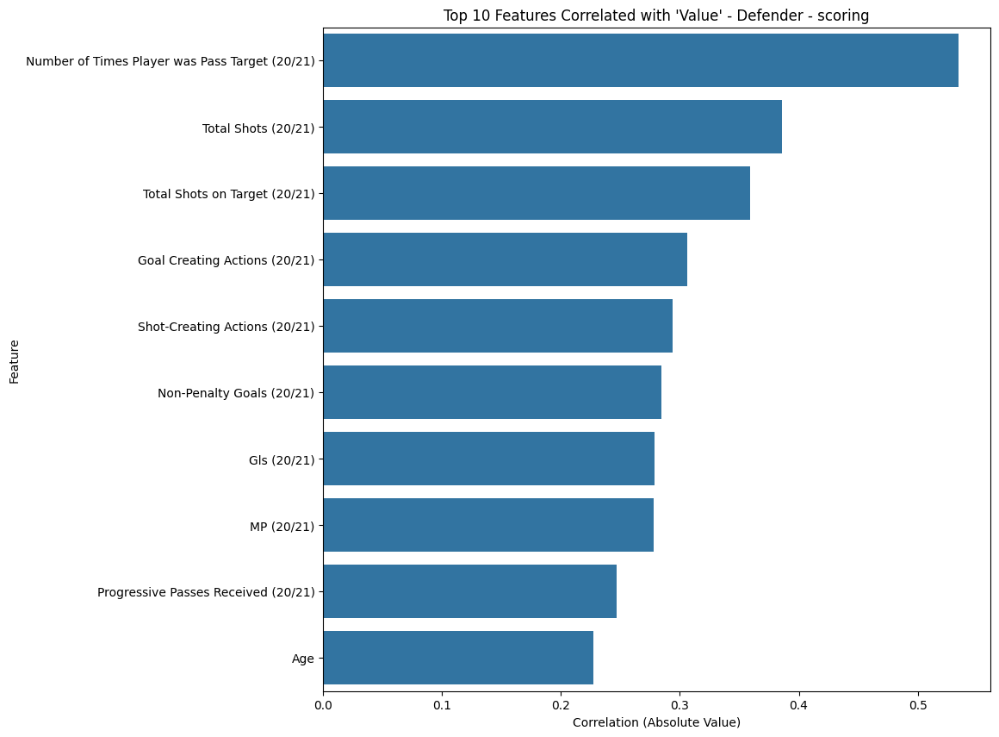

Position: attack
Group: passing


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



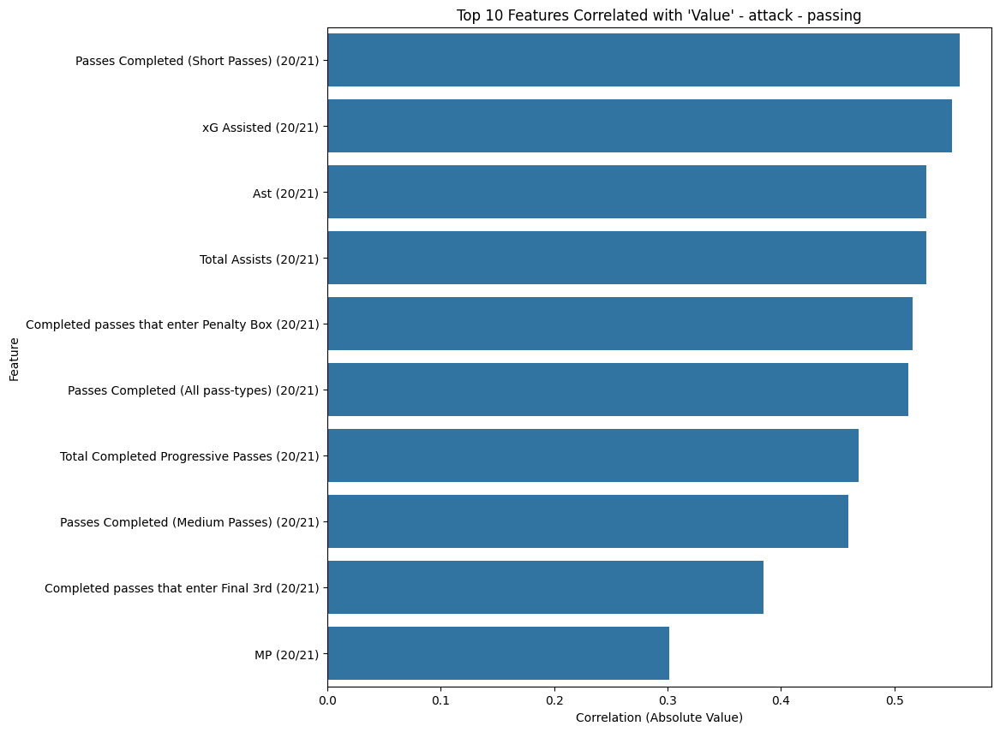

Group: defending


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



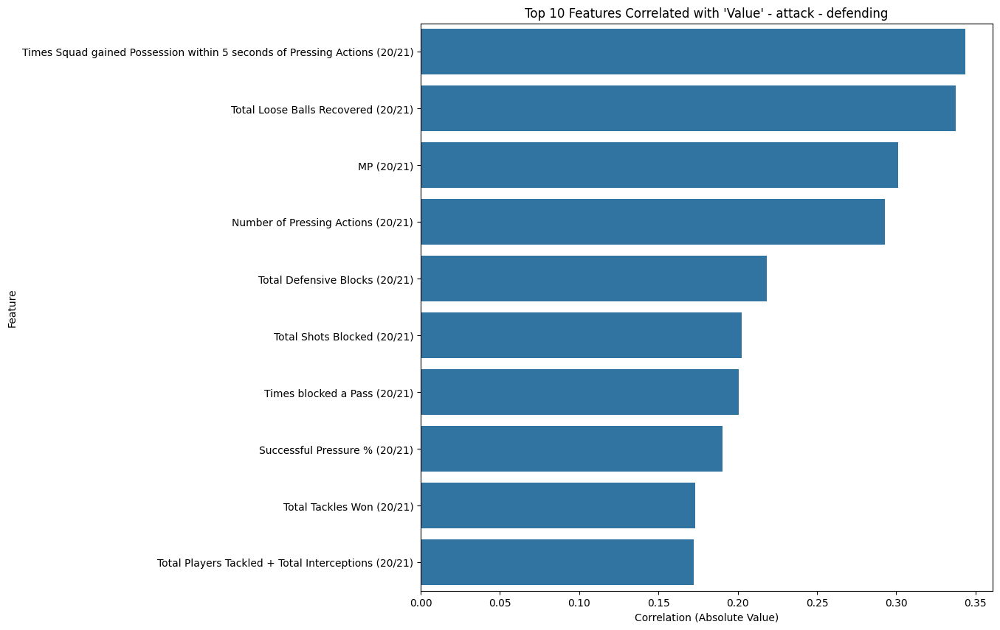

Group: scoring


<ipython-input-55-751b6f5954f4>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



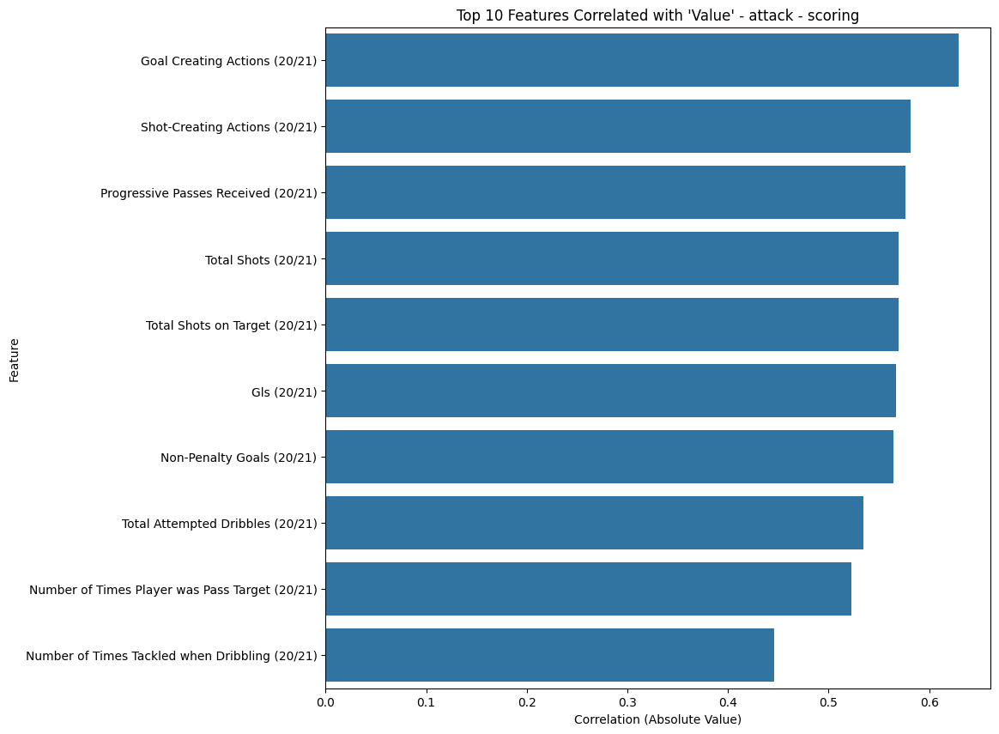

In [55]:
stat_groups = {'passing': passing_data, 'defending': defending_data, 'scoring': scoring_data}

for position in positions:
    print(f"Position: {position}")
    for group_name, group_data in stat_groups.items():
        print(f"Group: {group_name}")
        filtered_data = group_data[group_data['Position'] == position]
        filtered_data.drop('Position', axis=1, inplace=True)
        correlation_matrix = filtered_data.corr()
        top_5_features = correlation_matrix['Value'].abs().nlargest(11)
        top_5_features = top_5_features.drop('Value')
        plt.figure(figsize=(10, 10))
        sns.barplot(x=top_5_features.values, y=top_5_features.index)
        plt.title(f"Top 10 Features Correlated with 'Value' - {position} - {group_name}")
        plt.xlabel('Correlation (Absolute Value)')
        plt.ylabel('Feature')
        plt.show()

Position: midfield
Group: passing


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



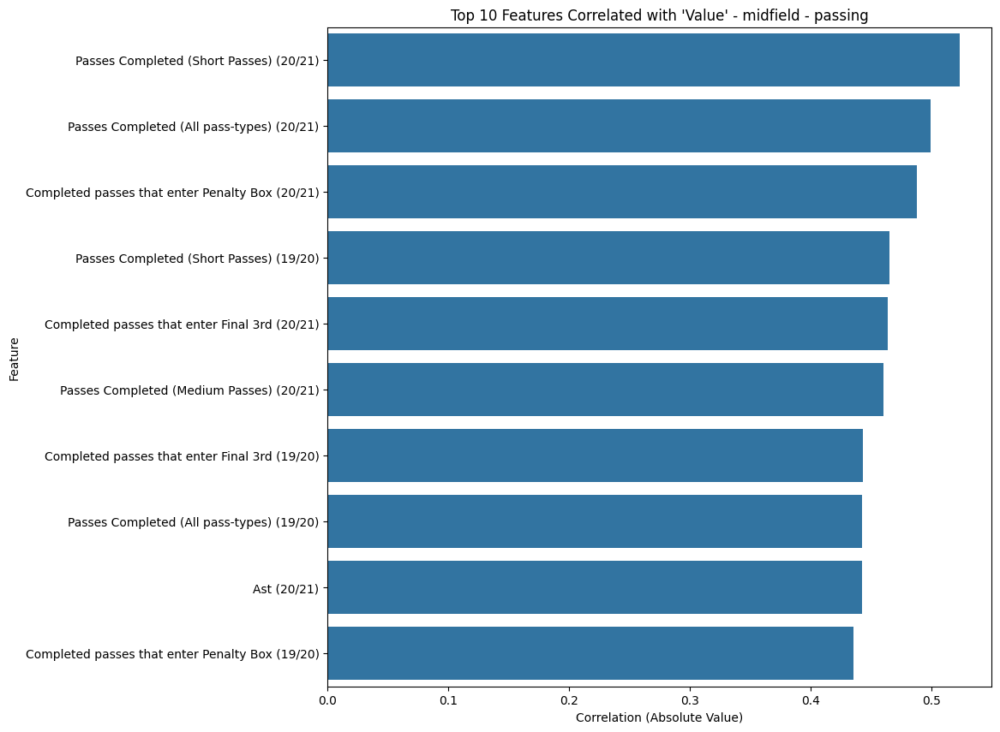

Group: defending


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



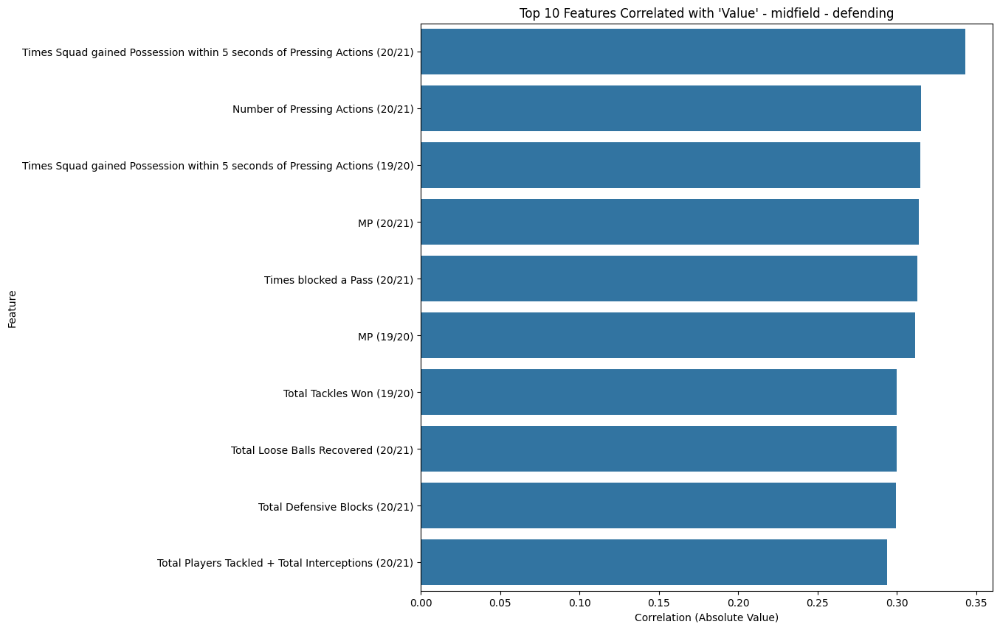

Group: scoring


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



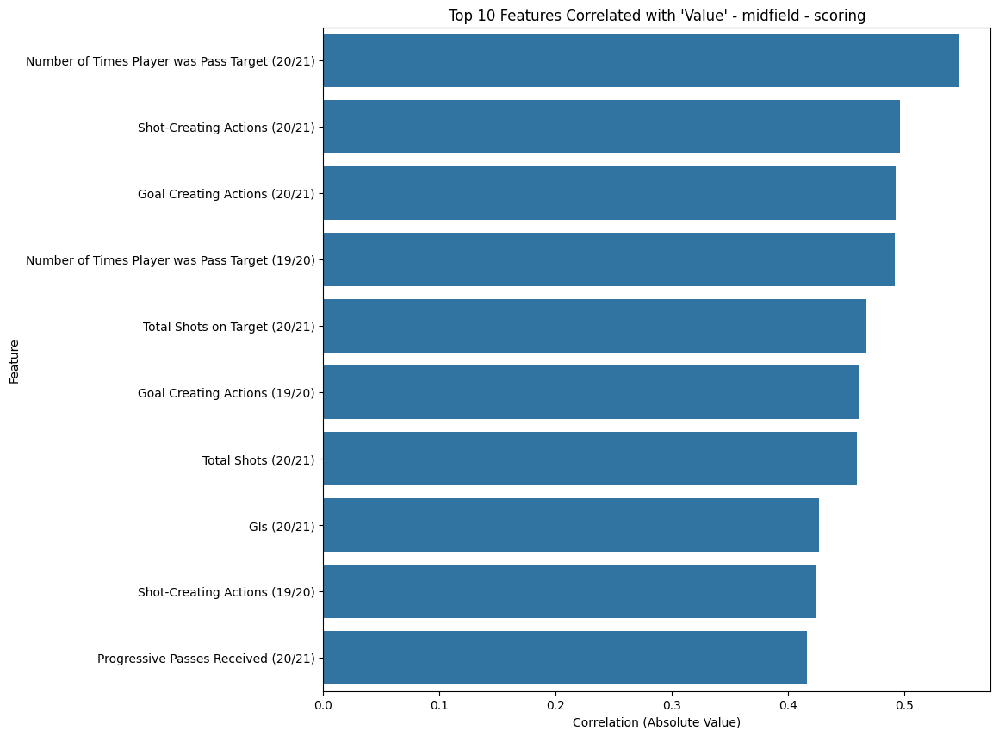

Position: Defender
Group: passing


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



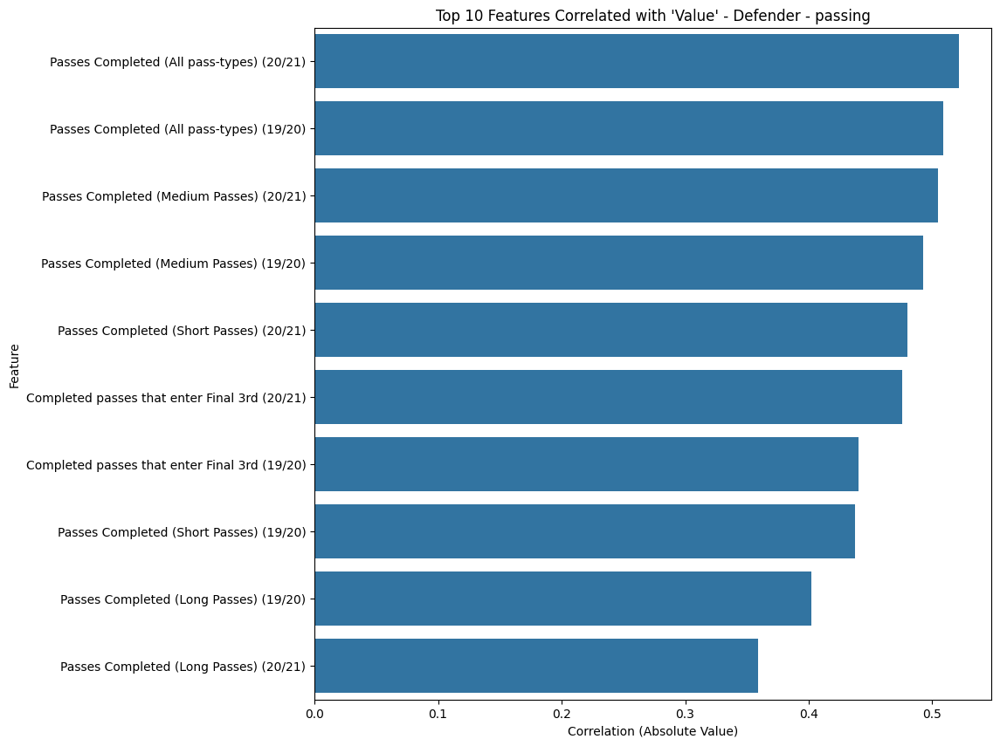

Group: defending


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



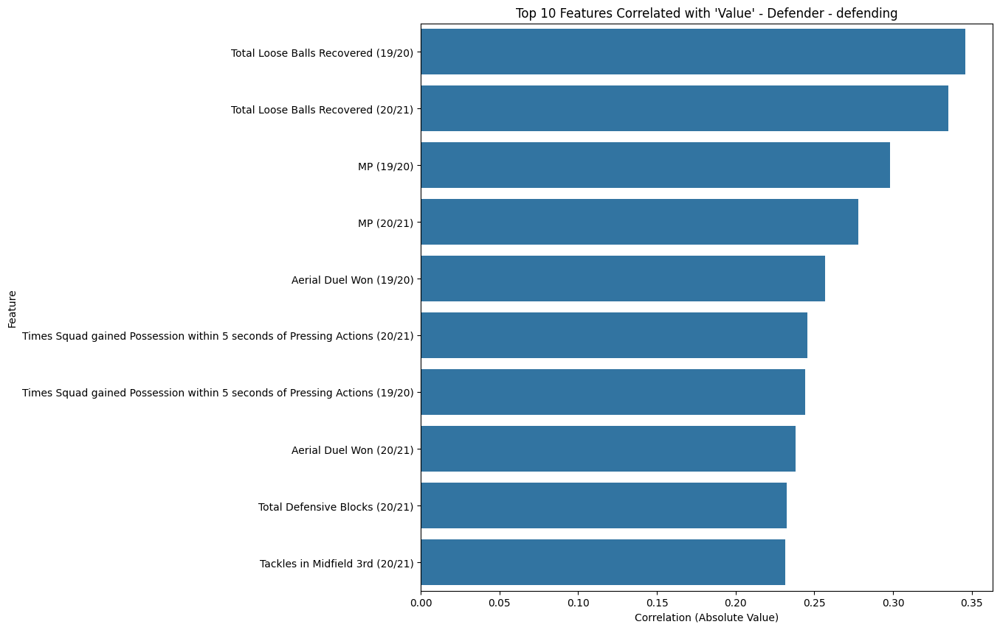

Group: scoring


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



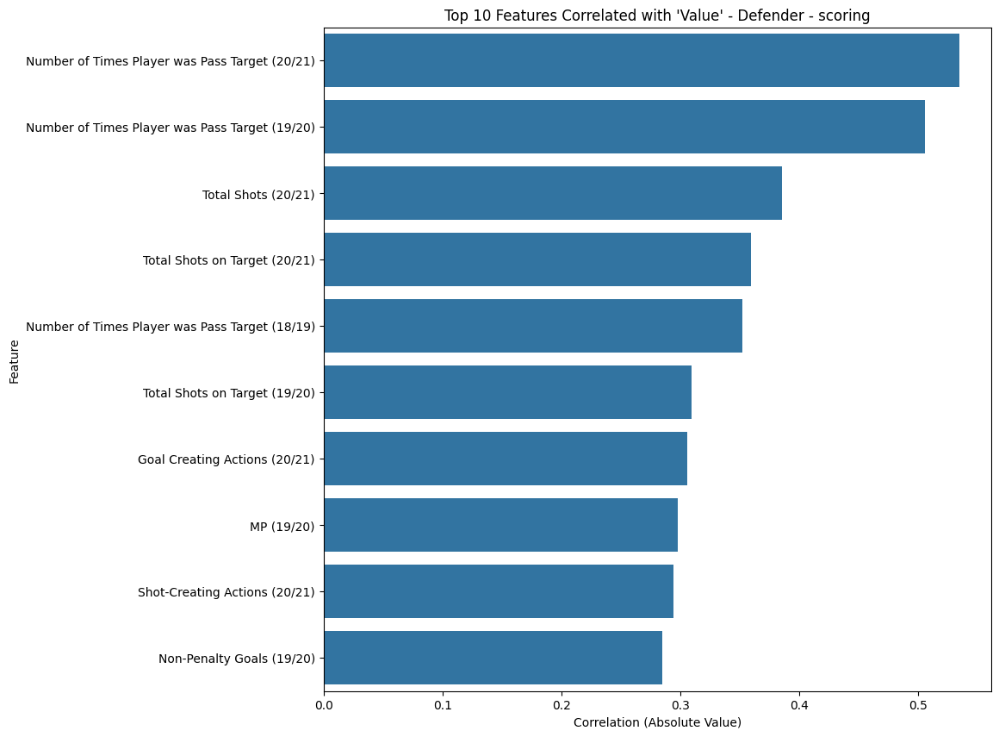

Position: attack
Group: passing


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



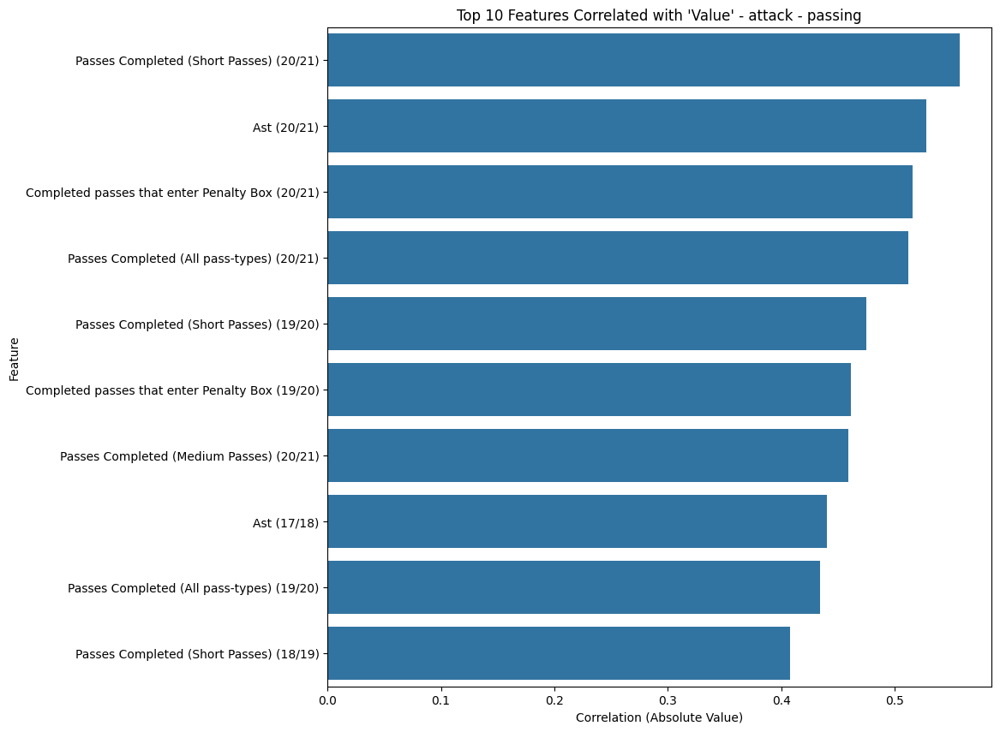

Group: defending


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



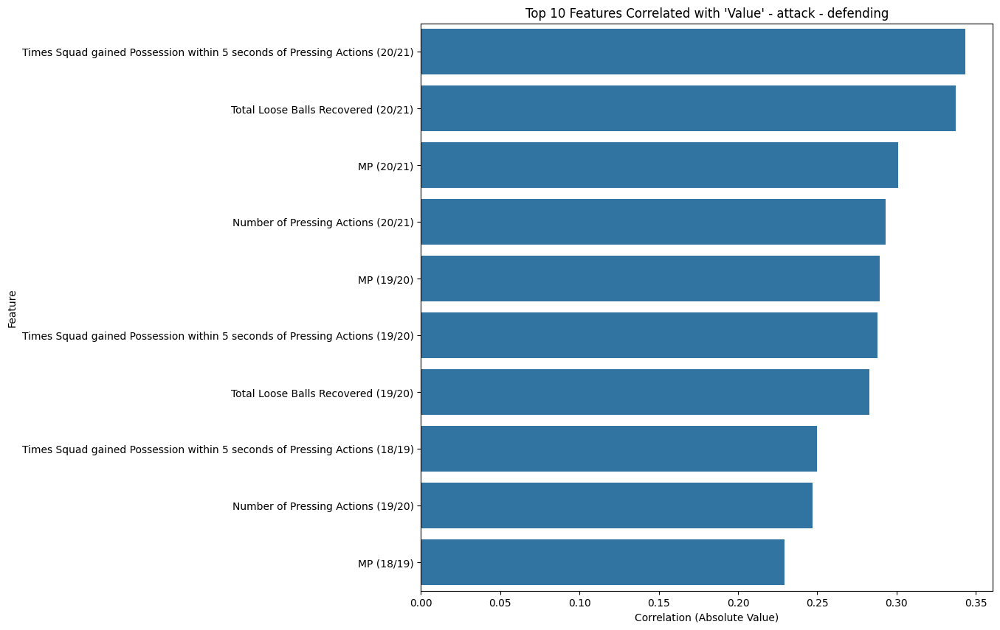

Group: scoring


<ipython-input-56-5608b68c231f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



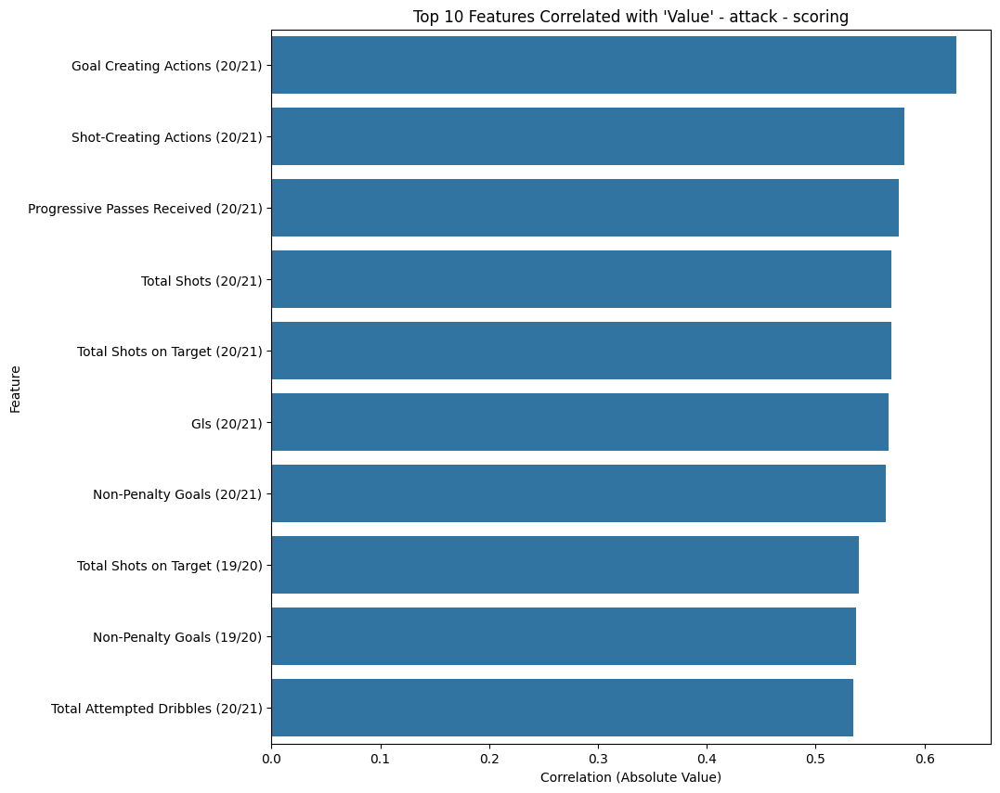

In [56]:
stat_groups = {'passing': passing_data_extended, 'defending': defending_data_extended, 'scoring': scoring_data_extended}

for position in positions:
    print(f"Position: {position}")
    for group_name, group_data in stat_groups.items():
        print(f"Group: {group_name}")
        filtered_data = group_data[group_data['Position'] == position]
        filtered_data.drop('Position', axis=1, inplace=True)
        correlation_matrix = filtered_data.corr()
        top_10_features = correlation_matrix['Value'].abs().nlargest(11)
        top_10_features = top_10_features.drop('Value')
        plt.figure(figsize=(10, 10))
        sns.barplot(x=top_10_features.values, y=top_10_features.index)
        plt.title(f"Top 10 Features Correlated with 'Value' - {position} - {group_name}")
        plt.xlabel('Correlation (Absolute Value)')
        plt.ylabel('Feature')
        plt.show()

In [57]:
result = stats.f_oneway(data[data['League'] == 'Premier League']['Value'],
                        data[data['League'] == 'Serie A']['Value'],
                        data[data['League'] == 'La Liga']['Value'],
                        data[data['League'] == 'Bundesliga']['Value'],
                        data[data['League'] == 'Ligue 1']['Value'])

# Print ANOVA results
print("ANOVA results:")
print("F-statistic:", result.statistic)
print("p-value:", result.pvalue)



ANOVA results:
F-statistic: 29.889316060725868
p-value: 3.333603890933726e-24


# Short Attempt at Predicting Player Values

In [58]:
data_filled_models = data_filled[data_filled['Position'] != 2]
data_filled_models = data_filled_models.drop(columns = ["Player", "Club"])
data_dropped_models = data_dropped[data_dropped['Position'] != 2]
data_dropped_models = data_dropped_models.drop(columns = ["Player", "Club"])


In [59]:
def get_top_correlated_features(df, target='Value', top_n=20):
    corr_data, mappings = encode_dataframe(df)
    corr_matrix = corr_data.corr()
    top_features = corr_matrix[target].abs().sort_values(ascending=False).head(top_n + 1).index.tolist()
    top_features.remove(target)
    return top_features

passing_top_features = get_top_correlated_features(passing_data_extended, 'Value')
defending_top_features = get_top_correlated_features(defending_data_extended, 'Value')
scoring_top_features = get_top_correlated_features(scoring_data_extended, 'Value')

all_top_features = list(set(passing_top_features + defending_top_features + scoring_top_features))
all_top_features.append('Value')

data_top_features_filled = data_filled_models[all_top_features].dropna()

X_filled = data_top_features_filled.drop('Value', axis=1)
y_filled = data_top_features_filled['Value']

data_top_features_dropped = data_dropped_models[all_top_features].dropna()

X_dropped = data_top_features_dropped.drop('Value', axis=1)
y_dropped = data_top_features_dropped['Value']

## DataFrame Filled with 0 Where Data Is Missing (hasn't played in that season, wasn't active, etc)

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X_filled, y_filled, test_size=0.2, random_state=42)

print(f'Training set shape: X_train: {X_train.shape}, y_train: {y_train.shape}')
print(f'Testing set shape: X_test: {X_test.shape}, y_test: {y_test.shape}')


Training set shape: X_train: (1496, 58), y_train: (1496,)
Testing set shape: X_test: (374, 58), y_test: (374,)


In [61]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Linear Regression - Mean Squared Error: {mse}')
print(f'Linear Regression - R-squared: {r2}')

Linear Regression - Mean Squared Error: 80968865505930.48
Linear Regression - R-squared: 0.505271758532487


In [62]:
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = ridge_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Ridge Regression - Mean Squared Error: {mse}')
print(f'Ridge Regression - R-squared: {r2}')

Ridge Regression - Mean Squared Error: 80962356041762.89
Ridge Regression - R-squared: 0.5053115320397531


In [63]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Random Forest Regression - Mean Squared Error: {mse}')
print(f'Random Forest Regression - R-squared: {r2}')

Random Forest Regression - Mean Squared Error: 78580226123223.52
Random Forest Regression - R-squared: 0.5198665951270556


## DataFrame Where We Drop Players Without a Full Record

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X_dropped, y_dropped, test_size=0.2, random_state=42)

print(f'Training set shape: X_train: {X_train.shape}, y_train: {y_train.shape}')
print(f'Testing set shape: X_test: {X_test.shape}, y_test: {y_test.shape}')


Training set shape: X_train: (492, 58), y_train: (492,)
Testing set shape: X_test: (124, 58), y_test: (124,)


In [65]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = linear_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Linear Regression - Mean Squared Error: {mse}')
print(f'Linear Regression - R-squared: {r2}')

Linear Regression - Mean Squared Error: 122622445494897.56
Linear Regression - R-squared: 0.6047419720717115


In [66]:
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = ridge_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Ridge Regression - Mean Squared Error: {mse}')
print(f'Ridge Regression - R-squared: {r2}')

Ridge Regression - Mean Squared Error: 122513370554228.94
Ridge Regression - R-squared: 0.6050935614220224


In [67]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Random Forest Regression - Mean Squared Error: {mse}')
print(f'Random Forest Regression - R-squared: {r2}')

Random Forest Regression - Mean Squared Error: 119408857300887.1
Random Forest Regression - R-squared: 0.6151005693661283
